In [18]:
import h2o
from h2o.automl import H2OAutoML

In [19]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

In [20]:
import warnings
warnings.filterwarnings('ignore')

In [21]:
import importlib
from importlib import reload

In [22]:
import autohelper
from autohelper import *

In [23]:
importlib.reload(autohelper)
reload(autohelper)

<module 'autohelper' from '/Users/user/Desktop/MMAi AI technologies/drivendata/autohelper.py'>

<h2> Data Cleaning and Engineering

In [24]:
data=pd.read_csv('marketing_campaign.csv',delimiter='\t')

In [25]:
data=autohelper.cleandata.cleaning(data)

In [26]:
data=autohelper.scaling(data)

In [27]:
data.head(3)

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,-0.986443,-0.409776,-1.348829,0.234063,-0.823039,-0.928972,-1.500343,0.310532,0.978226,1.549429,...,0.693232,-0.281773,-0.282705,-0.280839,-0.261661,-0.117148,-0.097812,0.0,0.0,1.0
1,-1.236801,-0.409776,-1.348829,-0.234559,1.039938,0.909066,1.417393,-0.380509,-0.872024,-0.637328,...,-0.131574,-0.281773,-0.282705,-0.280839,-0.261661,-0.117148,-0.097812,0.0,0.0,0.0
2,-0.318822,-0.409776,0.741384,0.769478,-0.823039,-0.928972,-0.041475,-0.795134,0.358511,0.569159,...,-0.543978,-0.281773,-0.282705,-0.280839,-0.261661,-0.117148,-0.097812,0.0,0.0,0.0


In [28]:
data.columns

Index(['Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response'],
      dtype='object')

<br><br>
<h2> H2o AutoML

In [29]:
import h2o
from h2o.automl import H2OAutoML

In [30]:
#Data has to be saved as Train and Test and imported into H20 as FRAMES

In [31]:
data[:-216].to_csv('h2o_train_data.csv')
data[-216:].to_csv('h2o_test_data.csv')

In [33]:
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: java version "1.8.0_311"; Java(TM) SE Runtime Environment (build 1.8.0_311-b11); Java HotSpot(TM) 64-Bit Server VM (build 25.311-b11, mixed mode)
  Starting server from /Users/user/.local/lib/python3.8/site-packages/h2o/backend/bin/h2o.jar
  Ice root: /var/folders/hz/8y75f1m13nq6ntspvm0p7y800000gn/T/tmptohitaow
  JVM stdout: /var/folders/hz/8y75f1m13nq6ntspvm0p7y800000gn/T/tmptohitaow/h2o_user_started_from_python.out
  JVM stderr: /var/folders/hz/8y75f1m13nq6ntspvm0p7y800000gn/T/tmptohitaow/h2o_user_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,14 secs
H2O_cluster_timezone:,America/Toronto
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.34.0.7
H2O_cluster_version_age:,"7 days, 8 hours and 42 minutes"
H2O_cluster_name:,H2O_from_python_user_9nc4nn
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,1.778 Gb
H2O_cluster_total_cores:,0
H2O_cluster_allowed_cores:,0
H2O_cluster_status:,"locked, healthy"


In [34]:
train=h2o.import_file('h2o_train_data.csv')
test=h2o.import_file('h2o_test_data.csv')

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [37]:
x = train.columns
y = "Response"
x.remove(y)

In [38]:
x.remove('C1')

In [39]:
x

['Year_Birth',
 'Education',
 'Marital_Status',
 'Income',
 'Kidhome',
 'Teenhome',
 'Dt_Customer',
 'Recency',
 'MntWines',
 'MntFruits',
 'MntMeatProducts',
 'MntFishProducts',
 'MntSweetProducts',
 'MntGoldProds',
 'NumDealsPurchases',
 'NumWebPurchases',
 'NumCatalogPurchases',
 'NumStorePurchases',
 'NumWebVisitsMonth',
 'AcceptedCmp3',
 'AcceptedCmp4',
 'AcceptedCmp5',
 'AcceptedCmp1',
 'AcceptedCmp2',
 'Complain',
 'Z_CostContact',
 'Z_Revenue']

In [40]:
train[y] = train[y].asfactor()
test[y] = test[y].asfactor()

In [41]:
train

C1,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,-0.986443,-0.409776,-1.34883,0.234063,-0.823039,-0.928972,-1.50034,0.310532,0.978226,1.54943,1.69023,2.45457,1.48483,0.850031,0.351713,1.42855,2.50471,-0.554143,0.693232,-0.281773,-0.282705,-0.280839,-0.261661,-0.117148,-0.0978121,0,0,1
1,-1.2368,-0.409776,-1.34883,-0.234559,1.03994,0.909066,1.41739,-0.380509,-0.872024,-0.637328,-0.717986,-0.651038,-0.63388,-0.732867,-0.168231,-1.12588,-0.571082,-1.16952,-0.131574,-0.281773,-0.282705,-0.280839,-0.261661,-0.117148,-0.0978121,0,0,0
2,-0.318822,-0.409776,0.741384,0.769478,-0.823039,-0.928972,-0.041475,-0.795134,0.358511,0.569159,-0.178368,1.3402,-0.146821,-0.0379365,-0.688176,1.42855,-0.229327,1.29198,-0.543978,-0.281773,-0.282705,-0.280839,-0.261661,-0.117148,-0.0978121,0,0,0
3,1.26678,-0.409776,0.741384,-1.01724,1.03994,-0.928972,1.41739,-0.795134,-0.872024,-0.561922,-0.655551,-0.504892,-0.585174,-0.752171,-0.168231,-0.760962,-0.912837,-0.554143,0.280829,-0.281773,-0.282705,-0.280839,-0.261661,-0.117148,-0.0978121,0,0,0
4,1.01642,1.12411,0.741384,0.240221,1.03994,-0.928972,1.41739,1.55441,-0.391671,0.418348,-0.218505,0.152766,-0.000703334,-0.559135,1.3916,0.333796,0.112428,0.061232,-0.131574,-0.281773,-0.282705,-0.280839,-0.261661,-0.117148,-0.0978121,0,0,0
5,-0.151917,1.12411,0.741384,0.407899,-0.823039,0.909066,-0.041475,-1.14066,0.637234,0.393213,-0.307698,-0.687574,0.364591,-0.578438,-0.168231,0.698715,0.454182,1.29198,0.280829,-0.281773,-0.282705,-0.280839,-0.261661,-0.117148,-0.0978121,0,0,0
6,0.181894,-0.409776,-1.34883,0.134609,-0.823039,0.909066,-1.50034,-0.518718,-0.207832,0.971321,-0.0133608,0.225839,0.535062,-0.327491,0.871658,1.06363,0.112428,0.368919,0.280829,-0.281773,-0.282705,-0.280839,-0.261661,-0.117148,-0.0978121,0,0,0
7,1.35023,1.12411,0.741384,-0.74673,1.03994,-0.928972,-0.041475,-0.587822,-0.67929,-0.411112,-0.495003,-0.63277,-0.63388,-0.404706,-0.168231,-0.0311235,-0.912837,-0.554143,1.10564,-0.281773,-0.282705,-0.280839,-0.261661,-0.117148,-0.0978121,0,0,0
8,0.432251,1.12411,0.741384,-0.870025,1.03994,-0.928972,-0.041475,-1.037,-0.863128,-0.662463,-0.637712,-0.63277,-0.585174,-0.810082,-0.688176,-0.396043,-0.912837,-1.16952,1.51804,-0.281773,-0.282705,-0.280839,-0.261661,-0.117148,-0.0978121,0,0,1
9,-1.57061,1.12411,0.741384,-1.85157,1.03994,0.909066,1.41739,0.656053,-0.821616,-0.662463,-0.717986,-0.669306,-0.63388,-0.597742,-0.688176,-1.12588,-0.912837,-1.78489,6.05447,3.54896,-0.282705,-0.280839,-0.261661,-0.117148,-0.0978121,0,0,0


In [42]:
aml = H2OAutoML(max_models=20, seed=1)

In [43]:
aml.train(x=x, y=y, training_frame=train)

AutoML progress: |
23:41:47.31: _train param, Dropping bad and constant columns: [Z_Revenue, Z_CostContact]


23:41:48.58: XGBoost_1_AutoML_1_20211228_234146 [XGBoost def_2] failed: water.exceptions.H2OModelBuilderIllegalArgumentException: Illegal argument(s) for XGBoost model: XGBoost_1_AutoML_1_20211228_234146_cv_1.  Details: ERRR on field: _response_column: Response contains missing values (NAs) - not supported by XGBoost.

23:41:48.65: _train param, Dropping bad and constant columns: [Z_Revenue, Z_CostContact]

████
23:41:55.153: _train param, Dropping bad and constant columns: [Z_Revenue, Z_CostContact]
23:42:03.204: _train param, Dropping unused columns: [Z_Revenue, Z_CostContact]


23:42:04.222: _train param, Dropping bad and constant columns: [Z_Revenue, Z_CostContact]
23:42:05.226: XGBoost_2_AutoML_1_20211228_234146 [XGBoost def_1] failed: water.exceptions.H2OModelBuilderIllegalArgumentException: Illegal argument(s) for XGBoost model: XGBoost_2_AutoML_1_20211228_234146_cv_1.  

,,layer,units,type,dropout,l1,l2,mean_rate,rate_rms,momentum,mean_weight,weight_rms,mean_bias,bias_rms
0,,1,25,Input,20.0,,,,,,,,,
1,,2,50,RectifierDropout,40.0,0.0,0.0,0.020931,0.035796,0.0,0.23504,1.827121,-6.066157,4.426956
2,,3,50,RectifierDropout,40.0,0.0,0.0,0.005112,0.007681,0.0,-0.19724,0.248258,-0.609562,0.459897
3,,4,2,Softmax,,0.0,0.0,0.033351,0.056764,0.0,0.020779,1.473891,-0.744527,0.499744




ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.11464586947833065
RMSE: 0.33859395960106947
LogLoss: 0.369768255736071
Mean Per-Class Error: 0.23229939045828213
AUC: 0.8143287732923549
AUCPR: 0.3660522094770453
Gini: 0.6286575465847097

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.26309425971469597: 


,,0,1,Error,Rate
0,0,1342.0,340.0,0.2021,(340.0/1682.0)
1,1,79.0,222.0,0.2625,(79.0/301.0)
2,Total,1421.0,562.0,0.2113,(419.0/1983.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.263094,0.514484,1.0
1,max f2,0.249638,0.631838,19.0
2,max f0point5,0.263552,0.435644,0.0
3,max accuracy,0.263552,0.789713,0.0
4,max precision,0.263552,0.395683,0.0
5,max recall,0.065913,1.000000,309.0
6,max specificity,0.263552,0.800238,0.0
7,max absolute_mcc,0.263094,0.426295,1.0
8,max min_per_class_accuracy,0.249638,0.766350,19.0
9,max mean_per_class_accuracy,0.263094,0.767701,1.0



Gains/Lift Table: Avg response rate: 15.18 %, avg score: 17.34 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.280383,2.635524e-01,2.606778,2.606778,0.395683,0.263552,0.395683,0.263552,0.730897,0.730897,160.677836,160.677836,0.531135
1,2,0.301059,2.553112e-01,0.642736,2.471894,0.097561,0.259582,0.375209,0.263280,0.013289,0.744186,-35.726440,147.189436,0.522426
2,3,0.400908,2.144467e-01,0.765277,2.046850,0.116162,0.234774,0.310692,0.256180,0.076412,0.820598,-23.472264,104.685012,0.494795
3,4,0.499244,1.813222e-01,0.608127,1.763465,0.092308,0.198765,0.267677,0.244871,0.059801,0.880399,-39.187324,76.346522,0.449364
4,5,0.599597,1.513592e-01,0.629009,1.573594,0.095477,0.164696,0.238856,0.231452,0.063123,0.943522,-37.099117,57.359405,0.405472
5,6,0.700454,1.255255e-01,0.395282,1.403931,0.060000,0.141679,0.213103,0.218526,0.039867,0.983389,-60.471761,40.393074,0.333567
6,7,0.800807,9.241956e-02,0.132423,1.244592,0.020101,0.109762,0.188917,0.204896,0.013289,0.996678,-86.757709,24.459191,0.230923
7,8,0.900656,4.798604e-02,0.033273,1.110302,0.005051,0.070133,0.168533,0.189956,0.003322,1.000000,-96.672707,11.030235,0.117122
8,9,1.000000,4.778066e-07,0.000000,1.000000,0.000000,0.023179,0.151790,0.173388,0.000000,1.000000,-100.000000,0.000000,0.000000




ModelMetricsBinomial: deeplearning
** Reported on cross-validation data. **

MSE: 0.13139233238054482
RMSE: 0.3624808027751881
LogLoss: 0.4389109342533559
Mean Per-Class Error: 0.4553144295076657
AUC: 0.5298588533663057
AUCPR: 0.16350452453760903
Gini: 0.05971770673261134

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.1554819891447339: 


,,0,1,Error,Rate
0,0,955.0,727.0,0.4322,(727.0/1682.0)
1,1,144.0,157.0,0.4784,(144.0/301.0)
2,Total,1099.0,884.0,0.4392,(871.0/1983.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.155482,0.264979,206.0
1,max f2,0.004044,0.472527,398.0
2,max f0point5,0.168797,0.211640,180.0
3,max accuracy,0.447950,0.847705,0.0
4,max precision,0.328311,0.208333,17.0
5,max recall,0.004044,1.000000,398.0
6,max specificity,0.447950,0.999405,0.0
7,max absolute_mcc,0.168424,0.074473,181.0
8,max min_per_class_accuracy,0.151655,0.538050,213.0
9,max mean_per_class_accuracy,0.168424,0.550107,181.0



Gains/Lift Table: Avg response rate: 15.18 %, avg score: 15.43 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.009581,0.343480,0.693478,0.693478,0.105263,0.384872,0.105263,0.384872,0.006645,0.006645,-30.652212,-30.652212,-0.003462
1,2,0.019163,0.304659,1.386956,1.040217,0.210526,0.319036,0.157895,0.351954,0.013289,0.019934,38.695576,4.021682,0.000909
2,3,0.029249,0.283449,0.988206,1.022282,0.150000,0.294182,0.155172,0.332033,0.009967,0.029900,-1.179402,2.228205,0.000768
3,4,0.039334,0.274148,0.988206,1.013545,0.150000,0.278732,0.153846,0.318366,0.009967,0.039867,-1.179402,1.354459,0.000628
4,5,0.049420,0.265162,1.317608,1.075598,0.200000,0.269688,0.163265,0.308432,0.013289,0.053156,31.760797,7.559835,0.004405
5,6,0.099344,0.237517,1.197825,1.137022,0.181818,0.249201,0.172589,0.278666,0.059801,0.112957,19.782543,13.702211,0.016048
6,7,0.149773,0.215835,0.922326,1.064734,0.140000,0.225375,0.161616,0.260723,0.046512,0.159468,-7.767442,6.473372,0.011430
7,8,0.200202,0.203233,1.119967,1.078646,0.170000,0.209583,0.163728,0.247841,0.056478,0.215947,11.996678,7.864633,0.018563
8,9,0.300050,0.181636,1.563828,1.240102,0.237374,0.191868,0.188235,0.229215,0.156146,0.372093,56.382765,24.010162,0.084935
9,10,0.400403,0.162751,0.960066,1.169916,0.145729,0.172470,0.177582,0.214993,0.096346,0.468439,-3.993389,16.991640,0.080210




Cross-Validation Metrics Summary: 


,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,accuracy,0.464303,0.237897,0.173367,0.503778,0.696970,0.266497,0.680905
1,auc,0.527562,0.065961,0.446621,0.530329,0.628919,0.528268,0.503673
2,err,0.535697,0.237897,0.826633,0.496222,0.303030,0.733503,0.319095
3,err_count,212.400000,94.248604,329.000000,197.000000,120.000000,289.000000,127.000000
4,f0point5,0.222627,0.045211,0.172847,0.247108,0.282847,0.184397,0.225933
5,f1,0.288956,0.040096,0.250569,0.323024,0.340659,0.264631,0.265896
6,f2,0.428249,0.060961,0.455298,0.466270,0.428177,0.468468,0.323034
7,lift_top_group,0.621852,0.854172,0.000000,0.000000,1.650000,1.459259,0.000000
8,logloss,0.438838,0.034953,0.423913,0.484912,0.417932,0.401689,0.465745
9,max_per_class_error,0.688052,0.205417,0.959184,0.530675,0.483333,0.844118,0.622951



Scoring History: 


,,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error
0,,2021-12-29 00:05:22,0.000 sec,None,0.000,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,,2021-12-29 00:05:23,10 min 36.222 sec,69094 obs/sec,9.915,1,19830.0,0.360315,0.434287,-0.008367,0.544085,0.186769,2.305814,0.485124
2,,2021-12-29 00:05:28,10 min 41.292 sec,118965 obs/sec,317.280,32,634560.0,0.348096,0.397346,0.058865,0.763163,0.331784,2.619341,0.296520
3,,2021-12-29 00:05:33,10 min 46.406 sec,127517 obs/sec,664.305,67,1328610.0,0.341446,0.379626,0.094484,0.804909,0.364105,2.682273,0.206757
4,,2021-12-29 00:05:38,10 min 51.434 sec,137583 obs/sec,1060.905,107,2121810.0,0.342057,0.374802,0.091241,0.818254,0.361301,2.572223,0.211800
5,,2021-12-29 00:05:43,10 min 56.577 sec,139056 obs/sec,1427.760,144,2855520.0,0.354743,0.409527,0.022579,0.822968,0.366243,2.551628,0.219869
6,,2021-12-29 00:05:48,11 min 2.143 sec,130972 obs/sec,1685.550,170,3371100.0,0.339869,0.372399,0.102828,0.816914,0.363088,2.560058,0.214826
7,,2021-12-29 00:05:53,11 min 7.085 sec,117256 obs/sec,1794.615,181,3589230.0,0.341186,0.377262,0.095859,0.806493,0.344001,2.385144,0.242562
8,,2021-12-29 00:05:57,11 min 10.824 sec,113231 obs/sec,1943.340,196,3886680.0,0.338594,0.369768,0.109546,0.814329,0.366052,2.606778,0.211296



Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,NumDealsPurchases,1.000000,1.000000,0.053352
1,Education,0.970585,0.970585,0.051783
2,Complain,0.950917,0.950917,0.050733
3,Marital_Status,0.870499,0.870499,0.046443
4,MntGoldProds,0.854164,0.854164,0.045571
5,MntMeatProducts,0.854115,0.854115,0.045569
6,AcceptedCmp2,0.842288,0.842288,0.044938
7,MntFruits,0.840512,0.840512,0.044843
8,Income,0.811186,0.811186,0.043278
9,AcceptedCmp3,0.786525,0.786525,0.041963



See the whole table with table.as_data_frame()


In [48]:
lb = aml.leaderboard
lb.head(rows=lb.nrows) 

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
DeepLearning_grid_2_AutoML_1_20211228_234146_model_2,0.529859,0.438911,0.163505,0.455314,0.362481,0.131392
DeepLearning_grid_3_AutoML_1_20211228_234146_model_2,0.512608,0.428701,0.158141,0.474746,0.35999,0.129593
DRF_1_AutoML_1_20211228_234146,0.502328,0.490617,0.155114,0.495068,0.377017,0.142142
GBM_grid_1_AutoML_1_20211228_234146_model_4,0.500751,0.439749,0.155297,0.496467,0.363821,0.132366
GBM_grid_1_AutoML_1_20211228_234146_model_3,0.495474,0.440611,0.147885,0.4929,0.364497,0.132858
DeepLearning_grid_1_AutoML_1_20211228_234146_model_2,0.495298,0.497,0.14789,0.5,0.370191,0.137041
DeepLearning_grid_3_AutoML_1_20211228_234146_model_1,0.492095,0.487064,0.149384,0.5,0.369523,0.136548
StackedEnsemble_AllModels_6_AutoML_1_20211228_234146,0.491745,0.448523,0.169915,0.499405,0.365075,0.13328
StackedEnsemble_BestOfFamily_7_AutoML_1_20211228_234146,0.489766,0.45392,0.147786,0.497604,0.369487,0.136521
GBM_1_AutoML_1_20211228_234146,0.489338,0.433555,0.145433,0.4897,0.361749,0.130863


In [49]:
lb.sort("mse").head(10)

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
StackedEnsemble_AllModels_7_AutoML_1_20211228_234146,0.480659,0.425885,0.144895,0.5,0.358847,0.128771
StackedEnsemble_BestOfFamily_8_AutoML_1_20211228_234146,0.472785,0.426144,0.141867,0.5,0.358941,0.128838
StackedEnsemble_BestOfFamily_1_AutoML_1_20211228_234146,0.470835,0.426226,0.142346,0.5,0.358969,0.128859
StackedEnsemble_AllModels_2_AutoML_1_20211228_234146,0.465948,0.426695,0.143062,0.5,0.359119,0.128966
GLM_1_AutoML_1_20211228_234146,0.462452,0.426679,0.136809,0.499703,0.35913,0.128975
StackedEnsemble_BestOfFamily_2_AutoML_1_20211228_234146,0.453678,0.426884,0.13589,0.495226,0.35919,0.129018
StackedEnsemble_AllModels_1_AutoML_1_20211228_234146,0.451132,0.426858,0.131075,0.499405,0.359192,0.129019
StackedEnsemble_BestOfFamily_3_AutoML_1_20211228_234146,0.454329,0.42712,0.138345,0.5,0.359261,0.129069
StackedEnsemble_AllModels_4_AutoML_1_20211228_234146,0.487867,0.427249,0.144598,0.5,0.359297,0.129094
StackedEnsemble_BestOfFamily_4_AutoML_1_20211228_234146,0.445096,0.427665,0.136364,0.497604,0.359429,0.129189


In [50]:
model = aml.leader

In [51]:
model

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_2_AutoML_1_20211228_234146_model_2


Status of Neuron Layers: predicting Response, 2-class classification, bernoulli distribution, CrossEntropy loss, 3,952 weights/biases, 57.0 KB, 3,886,680 training samples, mini-batch size 1


,,layer,units,type,dropout,l1,l2,mean_rate,rate_rms,momentum,mean_weight,weight_rms,mean_bias,bias_rms
0,,1,25,Input,20.0,,,,,,,,,
1,,2,50,RectifierDropout,40.0,0.0,0.0,0.020931,0.035796,0.0,0.23504,1.827121,-6.066157,4.426956
2,,3,50,RectifierDropout,40.0,0.0,0.0,0.005112,0.007681,0.0,-0.19724,0.248258,-0.609562,0.459897
3,,4,2,Softmax,,0.0,0.0,0.033351,0.056764,0.0,0.020779,1.473891,-0.744527,0.499744




ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.11464586947833065
RMSE: 0.33859395960106947
LogLoss: 0.369768255736071
Mean Per-Class Error: 0.23229939045828213
AUC: 0.8143287732923549
AUCPR: 0.3660522094770453
Gini: 0.6286575465847097

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.26309425971469597: 


,,0,1,Error,Rate
0,0,1342.0,340.0,0.2021,(340.0/1682.0)
1,1,79.0,222.0,0.2625,(79.0/301.0)
2,Total,1421.0,562.0,0.2113,(419.0/1983.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.263094,0.514484,1.0
1,max f2,0.249638,0.631838,19.0
2,max f0point5,0.263552,0.435644,0.0
3,max accuracy,0.263552,0.789713,0.0
4,max precision,0.263552,0.395683,0.0
5,max recall,0.065913,1.000000,309.0
6,max specificity,0.263552,0.800238,0.0
7,max absolute_mcc,0.263094,0.426295,1.0
8,max min_per_class_accuracy,0.249638,0.766350,19.0
9,max mean_per_class_accuracy,0.263094,0.767701,1.0



Gains/Lift Table: Avg response rate: 15.18 %, avg score: 17.34 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.280383,2.635524e-01,2.606778,2.606778,0.395683,0.263552,0.395683,0.263552,0.730897,0.730897,160.677836,160.677836,0.531135
1,2,0.301059,2.553112e-01,0.642736,2.471894,0.097561,0.259582,0.375209,0.263280,0.013289,0.744186,-35.726440,147.189436,0.522426
2,3,0.400908,2.144467e-01,0.765277,2.046850,0.116162,0.234774,0.310692,0.256180,0.076412,0.820598,-23.472264,104.685012,0.494795
3,4,0.499244,1.813222e-01,0.608127,1.763465,0.092308,0.198765,0.267677,0.244871,0.059801,0.880399,-39.187324,76.346522,0.449364
4,5,0.599597,1.513592e-01,0.629009,1.573594,0.095477,0.164696,0.238856,0.231452,0.063123,0.943522,-37.099117,57.359405,0.405472
5,6,0.700454,1.255255e-01,0.395282,1.403931,0.060000,0.141679,0.213103,0.218526,0.039867,0.983389,-60.471761,40.393074,0.333567
6,7,0.800807,9.241956e-02,0.132423,1.244592,0.020101,0.109762,0.188917,0.204896,0.013289,0.996678,-86.757709,24.459191,0.230923
7,8,0.900656,4.798604e-02,0.033273,1.110302,0.005051,0.070133,0.168533,0.189956,0.003322,1.000000,-96.672707,11.030235,0.117122
8,9,1.000000,4.778066e-07,0.000000,1.000000,0.000000,0.023179,0.151790,0.173388,0.000000,1.000000,-100.000000,0.000000,0.000000




ModelMetricsBinomial: deeplearning
** Reported on cross-validation data. **

MSE: 0.13139233238054482
RMSE: 0.3624808027751881
LogLoss: 0.4389109342533559
Mean Per-Class Error: 0.4553144295076657
AUC: 0.5298588533663057
AUCPR: 0.16350452453760903
Gini: 0.05971770673261134

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.1554819891447339: 


,,0,1,Error,Rate
0,0,955.0,727.0,0.4322,(727.0/1682.0)
1,1,144.0,157.0,0.4784,(144.0/301.0)
2,Total,1099.0,884.0,0.4392,(871.0/1983.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.155482,0.264979,206.0
1,max f2,0.004044,0.472527,398.0
2,max f0point5,0.168797,0.211640,180.0
3,max accuracy,0.447950,0.847705,0.0
4,max precision,0.328311,0.208333,17.0
5,max recall,0.004044,1.000000,398.0
6,max specificity,0.447950,0.999405,0.0
7,max absolute_mcc,0.168424,0.074473,181.0
8,max min_per_class_accuracy,0.151655,0.538050,213.0
9,max mean_per_class_accuracy,0.168424,0.550107,181.0



Gains/Lift Table: Avg response rate: 15.18 %, avg score: 15.43 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.009581,0.343480,0.693478,0.693478,0.105263,0.384872,0.105263,0.384872,0.006645,0.006645,-30.652212,-30.652212,-0.003462
1,2,0.019163,0.304659,1.386956,1.040217,0.210526,0.319036,0.157895,0.351954,0.013289,0.019934,38.695576,4.021682,0.000909
2,3,0.029249,0.283449,0.988206,1.022282,0.150000,0.294182,0.155172,0.332033,0.009967,0.029900,-1.179402,2.228205,0.000768
3,4,0.039334,0.274148,0.988206,1.013545,0.150000,0.278732,0.153846,0.318366,0.009967,0.039867,-1.179402,1.354459,0.000628
4,5,0.049420,0.265162,1.317608,1.075598,0.200000,0.269688,0.163265,0.308432,0.013289,0.053156,31.760797,7.559835,0.004405
5,6,0.099344,0.237517,1.197825,1.137022,0.181818,0.249201,0.172589,0.278666,0.059801,0.112957,19.782543,13.702211,0.016048
6,7,0.149773,0.215835,0.922326,1.064734,0.140000,0.225375,0.161616,0.260723,0.046512,0.159468,-7.767442,6.473372,0.011430
7,8,0.200202,0.203233,1.119967,1.078646,0.170000,0.209583,0.163728,0.247841,0.056478,0.215947,11.996678,7.864633,0.018563
8,9,0.300050,0.181636,1.563828,1.240102,0.237374,0.191868,0.188235,0.229215,0.156146,0.372093,56.382765,24.010162,0.084935
9,10,0.400403,0.162751,0.960066,1.169916,0.145729,0.172470,0.177582,0.214993,0.096346,0.468439,-3.993389,16.991640,0.080210




Cross-Validation Metrics Summary: 


,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,accuracy,0.464303,0.237897,0.173367,0.503778,0.696970,0.266497,0.680905
1,auc,0.527562,0.065961,0.446621,0.530329,0.628919,0.528268,0.503673
2,err,0.535697,0.237897,0.826633,0.496222,0.303030,0.733503,0.319095
3,err_count,212.400000,94.248604,329.000000,197.000000,120.000000,289.000000,127.000000
4,f0point5,0.222627,0.045211,0.172847,0.247108,0.282847,0.184397,0.225933
5,f1,0.288956,0.040096,0.250569,0.323024,0.340659,0.264631,0.265896
6,f2,0.428249,0.060961,0.455298,0.466270,0.428177,0.468468,0.323034
7,lift_top_group,0.621852,0.854172,0.000000,0.000000,1.650000,1.459259,0.000000
8,logloss,0.438838,0.034953,0.423913,0.484912,0.417932,0.401689,0.465745
9,max_per_class_error,0.688052,0.205417,0.959184,0.530675,0.483333,0.844118,0.622951



Scoring History: 


,,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error
0,,2021-12-29 00:05:22,0.000 sec,None,0.000,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,,2021-12-29 00:05:23,10 min 36.222 sec,69094 obs/sec,9.915,1,19830.0,0.360315,0.434287,-0.008367,0.544085,0.186769,2.305814,0.485124
2,,2021-12-29 00:05:28,10 min 41.292 sec,118965 obs/sec,317.280,32,634560.0,0.348096,0.397346,0.058865,0.763163,0.331784,2.619341,0.296520
3,,2021-12-29 00:05:33,10 min 46.406 sec,127517 obs/sec,664.305,67,1328610.0,0.341446,0.379626,0.094484,0.804909,0.364105,2.682273,0.206757
4,,2021-12-29 00:05:38,10 min 51.434 sec,137583 obs/sec,1060.905,107,2121810.0,0.342057,0.374802,0.091241,0.818254,0.361301,2.572223,0.211800
5,,2021-12-29 00:05:43,10 min 56.577 sec,139056 obs/sec,1427.760,144,2855520.0,0.354743,0.409527,0.022579,0.822968,0.366243,2.551628,0.219869
6,,2021-12-29 00:05:48,11 min 2.143 sec,130972 obs/sec,1685.550,170,3371100.0,0.339869,0.372399,0.102828,0.816914,0.363088,2.560058,0.214826
7,,2021-12-29 00:05:53,11 min 7.085 sec,117256 obs/sec,1794.615,181,3589230.0,0.341186,0.377262,0.095859,0.806493,0.344001,2.385144,0.242562
8,,2021-12-29 00:05:57,11 min 10.824 sec,113231 obs/sec,1943.340,196,3886680.0,0.338594,0.369768,0.109546,0.814329,0.366052,2.606778,0.211296



Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,NumDealsPurchases,1.000000,1.000000,0.053352
1,Education,0.970585,0.970585,0.051783
2,Complain,0.950917,0.950917,0.050733
3,Marital_Status,0.870499,0.870499,0.046443
4,MntGoldProds,0.854164,0.854164,0.045571
5,MntMeatProducts,0.854115,0.854115,0.045569
6,AcceptedCmp2,0.842288,0.842288,0.044938
7,MntFruits,0.840512,0.840512,0.044843
8,Income,0.811186,0.811186,0.043278
9,AcceptedCmp3,0.786525,0.786525,0.041963



See the whole table with table.as_data_frame()


<H2>Predictions

In [52]:
preds = aml.predict(test)

deeplearning prediction progress: |██████████████████████████████████████████████| (done) 100%


In [53]:
preds

predict,p0,p1
0,0.839969,0.160031
1,0.736448,0.263552
0,0.841836,0.158164
0,0.832148,0.167852
0,0.795952,0.204048
0,0.8656,0.1344
0,0.753258,0.246742
0,0.769834,0.230166
1,0.736448,0.263552
0,0.878716,0.121284


<h2> Save and Load an H2o Model

In [124]:
#Save and Load a Model
#http://h2o-release.s3.amazonaws.com/h2o/rel-xu/6/docs-website/h2o-docs/save-and-load-model.html

In [126]:
model_path = h2o.save_model(model=model_no1, path="/Users/user/Desktop", force=True)

In [128]:
print (model_path)

/Users/user/Desktop/DeepLearning_grid_2_AutoML_1_20211228_234146_model_2


In [129]:
saved_model = h2o.load_model(model_path)

In [130]:
saved_model

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_2_AutoML_1_20211228_234146_model_2


Status of Neuron Layers: predicting Response, 2-class classification, bernoulli distribution, CrossEntropy loss, 3,952 weights/biases, 57.0 KB, 3,886,680 training samples, mini-batch size 1


,,layer,units,type,dropout,l1,l2,mean_rate,rate_rms,momentum,mean_weight,weight_rms,mean_bias,bias_rms
0,,1,25,Input,20.0,,,,,,,,,
1,,2,50,RectifierDropout,40.0,0.0,0.0,0.020931,0.035796,0.0,0.23504,1.827121,-6.066157,4.426956
2,,3,50,RectifierDropout,40.0,0.0,0.0,0.005112,0.007681,0.0,-0.19724,0.248258,-0.609562,0.459897
3,,4,2,Softmax,,0.0,0.0,0.033351,0.056764,0.0,0.020779,1.473891,-0.744527,0.499744




ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.11464586947833065
RMSE: 0.33859395960106947
LogLoss: 0.369768255736071
Mean Per-Class Error: 0.23229939045828213
AUC: 0.8143287732923549
AUCPR: 0.3660522094770453
Gini: 0.6286575465847097

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.26309425971469597: 


,,0,1,Error,Rate
0,0,1342.0,340.0,0.2021,(340.0/1682.0)
1,1,79.0,222.0,0.2625,(79.0/301.0)
2,Total,1421.0,562.0,0.2113,(419.0/1983.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.263094,0.514484,1.0
1,max f2,0.249638,0.631838,19.0
2,max f0point5,0.263552,0.435644,0.0
3,max accuracy,0.263552,0.789713,0.0
4,max precision,0.263552,0.395683,0.0
5,max recall,0.065913,1.000000,309.0
6,max specificity,0.263552,0.800238,0.0
7,max absolute_mcc,0.263094,0.426295,1.0
8,max min_per_class_accuracy,0.249638,0.766350,19.0
9,max mean_per_class_accuracy,0.263094,0.767701,1.0



Gains/Lift Table: Avg response rate: 15.18 %, avg score: 17.34 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.280383,2.635524e-01,2.606778,2.606778,0.395683,0.263552,0.395683,0.263552,0.730897,0.730897,160.677836,160.677836,0.531135
1,2,0.301059,2.553112e-01,0.642736,2.471894,0.097561,0.259582,0.375209,0.263280,0.013289,0.744186,-35.726440,147.189436,0.522426
2,3,0.400908,2.144467e-01,0.765277,2.046850,0.116162,0.234774,0.310692,0.256180,0.076412,0.820598,-23.472264,104.685012,0.494795
3,4,0.499244,1.813222e-01,0.608127,1.763465,0.092308,0.198765,0.267677,0.244871,0.059801,0.880399,-39.187324,76.346522,0.449364
4,5,0.599597,1.513592e-01,0.629009,1.573594,0.095477,0.164696,0.238856,0.231452,0.063123,0.943522,-37.099117,57.359405,0.405472
5,6,0.700454,1.255255e-01,0.395282,1.403931,0.060000,0.141679,0.213103,0.218526,0.039867,0.983389,-60.471761,40.393074,0.333567
6,7,0.800807,9.241956e-02,0.132423,1.244592,0.020101,0.109762,0.188917,0.204896,0.013289,0.996678,-86.757709,24.459191,0.230923
7,8,0.900656,4.798604e-02,0.033273,1.110302,0.005051,0.070133,0.168533,0.189956,0.003322,1.000000,-96.672707,11.030235,0.117122
8,9,1.000000,4.778066e-07,0.000000,1.000000,0.000000,0.023179,0.151790,0.173388,0.000000,1.000000,-100.000000,0.000000,0.000000




ModelMetricsBinomial: deeplearning
** Reported on cross-validation data. **

MSE: 0.13139233238054482
RMSE: 0.3624808027751881
LogLoss: 0.4389109342533559
Mean Per-Class Error: 0.4553144295076657
AUC: 0.5298588533663057
AUCPR: 0.16350452453760903
Gini: 0.05971770673261134

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.1554819891447339: 


,,0,1,Error,Rate
0,0,955.0,727.0,0.4322,(727.0/1682.0)
1,1,144.0,157.0,0.4784,(144.0/301.0)
2,Total,1099.0,884.0,0.4392,(871.0/1983.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.155482,0.264979,206.0
1,max f2,0.004044,0.472527,398.0
2,max f0point5,0.168797,0.211640,180.0
3,max accuracy,0.447950,0.847705,0.0
4,max precision,0.328311,0.208333,17.0
5,max recall,0.004044,1.000000,398.0
6,max specificity,0.447950,0.999405,0.0
7,max absolute_mcc,0.168424,0.074473,181.0
8,max min_per_class_accuracy,0.151655,0.538050,213.0
9,max mean_per_class_accuracy,0.168424,0.550107,181.0



Gains/Lift Table: Avg response rate: 15.18 %, avg score: 15.43 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.009581,0.343480,0.693478,0.693478,0.105263,0.384872,0.105263,0.384872,0.006645,0.006645,-30.652212,-30.652212,-0.003462
1,2,0.019163,0.304659,1.386956,1.040217,0.210526,0.319036,0.157895,0.351954,0.013289,0.019934,38.695576,4.021682,0.000909
2,3,0.029249,0.283449,0.988206,1.022282,0.150000,0.294182,0.155172,0.332033,0.009967,0.029900,-1.179402,2.228205,0.000768
3,4,0.039334,0.274148,0.988206,1.013545,0.150000,0.278732,0.153846,0.318366,0.009967,0.039867,-1.179402,1.354459,0.000628
4,5,0.049420,0.265162,1.317608,1.075598,0.200000,0.269688,0.163265,0.308432,0.013289,0.053156,31.760797,7.559835,0.004405
5,6,0.099344,0.237517,1.197825,1.137022,0.181818,0.249201,0.172589,0.278666,0.059801,0.112957,19.782543,13.702211,0.016048
6,7,0.149773,0.215835,0.922326,1.064734,0.140000,0.225375,0.161616,0.260723,0.046512,0.159468,-7.767442,6.473372,0.011430
7,8,0.200202,0.203233,1.119967,1.078646,0.170000,0.209583,0.163728,0.247841,0.056478,0.215947,11.996678,7.864633,0.018563
8,9,0.300050,0.181636,1.563828,1.240102,0.237374,0.191868,0.188235,0.229215,0.156146,0.372093,56.382765,24.010162,0.084935
9,10,0.400403,0.162751,0.960066,1.169916,0.145729,0.172470,0.177582,0.214993,0.096346,0.468439,-3.993389,16.991640,0.080210




Cross-Validation Metrics Summary: 


,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,accuracy,0.464303,0.237897,0.173367,0.503778,0.696970,0.266497,0.680905
1,auc,0.527562,0.065961,0.446621,0.530329,0.628919,0.528268,0.503673
2,err,0.535697,0.237897,0.826633,0.496222,0.303030,0.733503,0.319095
3,err_count,212.400000,94.248604,329.000000,197.000000,120.000000,289.000000,127.000000
4,f0point5,0.222627,0.045211,0.172847,0.247108,0.282847,0.184397,0.225933
5,f1,0.288956,0.040096,0.250569,0.323024,0.340659,0.264631,0.265896
6,f2,0.428249,0.060961,0.455298,0.466270,0.428177,0.468468,0.323034
7,lift_top_group,0.621852,0.854172,0.000000,0.000000,1.650000,1.459259,0.000000
8,logloss,0.438838,0.034953,0.423913,0.484912,0.417932,0.401689,0.465745
9,max_per_class_error,0.688052,0.205417,0.959184,0.530675,0.483333,0.844118,0.622951



Scoring History: 


,,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error
0,,2021-12-29 00:05:22,0.000 sec,None,0.000,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,,2021-12-29 00:05:23,10 min 36.222 sec,69094 obs/sec,9.915,1,19830.0,0.360315,0.434287,-0.008367,0.544085,0.186769,2.305814,0.485124
2,,2021-12-29 00:05:28,10 min 41.292 sec,118965 obs/sec,317.280,32,634560.0,0.348096,0.397346,0.058865,0.763163,0.331784,2.619341,0.296520
3,,2021-12-29 00:05:33,10 min 46.406 sec,127517 obs/sec,664.305,67,1328610.0,0.341446,0.379626,0.094484,0.804909,0.364105,2.682273,0.206757
4,,2021-12-29 00:05:38,10 min 51.434 sec,137583 obs/sec,1060.905,107,2121810.0,0.342057,0.374802,0.091241,0.818254,0.361301,2.572223,0.211800
5,,2021-12-29 00:05:43,10 min 56.577 sec,139056 obs/sec,1427.760,144,2855520.0,0.354743,0.409527,0.022579,0.822968,0.366243,2.551628,0.219869
6,,2021-12-29 00:05:48,11 min 2.143 sec,130972 obs/sec,1685.550,170,3371100.0,0.339869,0.372399,0.102828,0.816914,0.363088,2.560058,0.214826
7,,2021-12-29 00:05:53,11 min 7.085 sec,117256 obs/sec,1794.615,181,3589230.0,0.341186,0.377262,0.095859,0.806493,0.344001,2.385144,0.242562
8,,2021-12-29 00:05:57,11 min 10.824 sec,113231 obs/sec,1943.340,196,3886680.0,0.338594,0.369768,0.109546,0.814329,0.366052,2.606778,0.211296



Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,NumDealsPurchases,1.000000,1.000000,0.053352
1,Education,0.970585,0.970585,0.051783
2,Complain,0.950917,0.950917,0.050733
3,Marital_Status,0.870499,0.870499,0.046443
4,MntGoldProds,0.854164,0.854164,0.045571
5,MntMeatProducts,0.854115,0.854115,0.045569
6,AcceptedCmp2,0.842288,0.842288,0.044938
7,MntFruits,0.840512,0.840512,0.044843
8,Income,0.811186,0.811186,0.043278
9,AcceptedCmp3,0.786525,0.786525,0.041963



See the whole table with table.as_data_frame()


In [132]:
test=h2o.import_file('h2o_test_data.csv')

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [133]:
saved_model.predict(test)

deeplearning prediction progress: |██████████████████████████████████████████████| (done) 100%


predict,p0,p1
0,0.839969,0.160031
1,0.736448,0.263552
0,0.841836,0.158164
0,0.832148,0.167852
0,0.795952,0.204048
0,0.8656,0.1344
0,0.753258,0.246742
0,0.769834,0.230166
1,0.736448,0.263552
0,0.878716,0.121284


<H2> Best Model

In [54]:
lb['model_id'].head(3)

model_id
DeepLearning_grid_2_AutoML_1_20211228_234146_model_2
DeepLearning_grid_3_AutoML_1_20211228_234146_model_2
DRF_1_AutoML_1_20211228_234146


In [58]:
aml.get_best_model(algorithm="xgboost")

In [59]:
model_no1 = h2o.get_model("DeepLearning_grid_2_AutoML_1_20211228_234146_model_2")

In [60]:
model_no2 = h2o.get_model("DeepLearning_grid_3_AutoML_1_20211228_234146_model_2")

In [ ]:
#for feature importance use a tree

In [61]:
model_features = h2o.get_model("DRF_1_AutoML_1_20211228_234146")

In [62]:
model_no1.params.keys()

dict_keys(['model_id', 'training_frame', 'validation_frame', 'nfolds', 'keep_cross_validation_models', 'keep_cross_validation_predictions', 'keep_cross_validation_fold_assignment', 'fold_assignment', 'fold_column', 'response_column', 'ignored_columns', 'ignore_const_cols', 'score_each_iteration', 'weights_column', 'offset_column', 'balance_classes', 'class_sampling_factors', 'max_after_balance_size', 'max_confusion_matrix_size', 'checkpoint', 'pretrained_autoencoder', 'overwrite_with_best_model', 'use_all_factor_levels', 'standardize', 'activation', 'hidden', 'epochs', 'train_samples_per_iteration', 'target_ratio_comm_to_comp', 'seed', 'adaptive_rate', 'rho', 'epsilon', 'rate', 'rate_annealing', 'rate_decay', 'momentum_start', 'momentum_ramp', 'momentum_stable', 'nesterov_accelerated_gradient', 'input_dropout_ratio', 'hidden_dropout_ratios', 'l1', 'l2', 'max_w2', 'initial_weight_distribution', 'initial_weight_scale', 'initial_weights', 'initial_biases', 'loss', 'distribution', 'quantil

In [63]:
model_no1.params['auc_type']

{'default': 'AUTO', 'actual': 'AUTO', 'input': 'AUTO'}

<h2> Parameteres : Get parameters of the leading model

In [64]:
for i in model_no1.params.keys():
    print(model_no1.params[i])
    print('******')

{'default': None, 'actual': {'__meta': {'schema_version': 3, 'schema_name': 'ModelKeyV3', 'schema_type': 'Key<Model>'}, 'name': 'DeepLearning_grid_2_AutoML_1_20211228_234146_model_2', 'type': 'Key<Model>', 'URL': '/3/Models/DeepLearning_grid_2_AutoML_1_20211228_234146_model_2'}, 'input': None}
******
{'default': None, 'actual': {'__meta': {'schema_version': 3, 'schema_name': 'FrameKeyV3', 'schema_type': 'Key<Frame>'}, 'name': 'AutoML_1_20211228_234146_training_py_1_sid_810f', 'type': 'Key<Frame>', 'URL': '/3/Frames/AutoML_1_20211228_234146_training_py_1_sid_810f'}, 'input': {'__meta': {'schema_version': 3, 'schema_name': 'FrameKeyV3', 'schema_type': 'Key<Frame>'}, 'name': 'AutoML_1_20211228_234146_training_py_1_sid_810f', 'type': 'Key<Frame>', 'URL': '/3/Frames/AutoML_1_20211228_234146_training_py_1_sid_810f'}}
******
{'default': None, 'actual': None, 'input': None}
******
{'default': 0, 'actual': 5, 'input': 5}
******
{'default': True, 'actual': False, 'input': False}
******
{'default

In [65]:
for i in model_features.params.keys():
    print(model_features.params[i])
    print('******')

{'default': None, 'actual': {'__meta': {'schema_version': 3, 'schema_name': 'ModelKeyV3', 'schema_type': 'Key<Model>'}, 'name': 'DRF_1_AutoML_1_20211228_234146', 'type': 'Key<Model>', 'URL': '/3/Models/DRF_1_AutoML_1_20211228_234146'}, 'input': None}
******
{'default': None, 'actual': {'__meta': {'schema_version': 3, 'schema_name': 'FrameKeyV3', 'schema_type': 'Key<Frame>'}, 'name': 'AutoML_1_20211228_234146_training_py_1_sid_810f', 'type': 'Key<Frame>', 'URL': '/3/Frames/AutoML_1_20211228_234146_training_py_1_sid_810f'}, 'input': {'__meta': {'schema_version': 3, 'schema_name': 'FrameKeyV3', 'schema_type': 'Key<Frame>'}, 'name': 'AutoML_1_20211228_234146_training_py_1_sid_810f', 'type': 'Key<Frame>', 'URL': '/3/Frames/AutoML_1_20211228_234146_training_py_1_sid_810f'}}
******
{'default': None, 'actual': None, 'input': None}
******
{'default': 0, 'actual': 5, 'input': 5}
******
{'default': True, 'actual': False, 'input': False}
******
{'default': False, 'actual': True, 'input': True}
***

In [66]:
#Model to show feature importance must be a tree based model

<h2> Model Explainibility<br>
    <a>https://docs.h2o.ai/h2o/latest-stable/h2o-docs/explain.html</a>

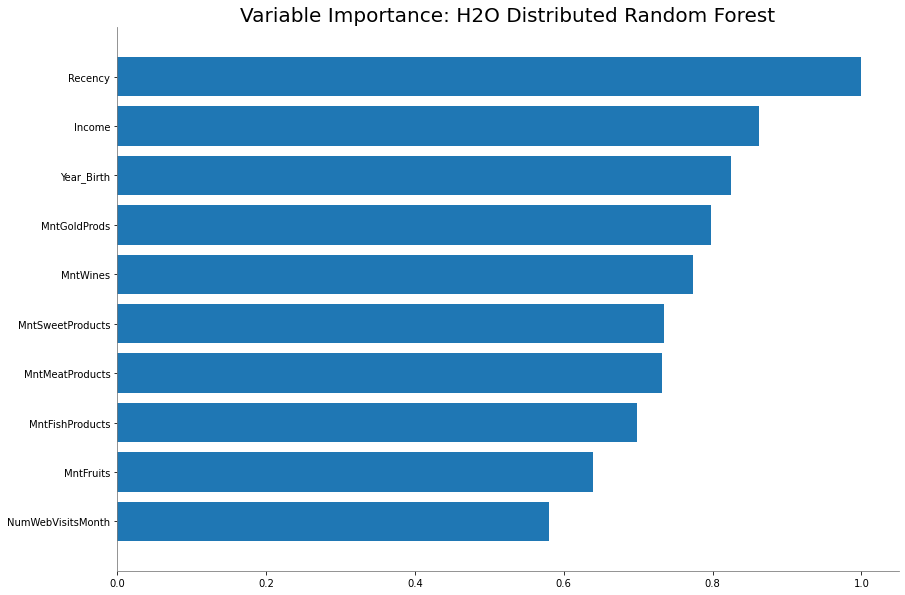

<Figure size 432x288 with 0 Axes>

In [67]:
model_features.varimp_plot()

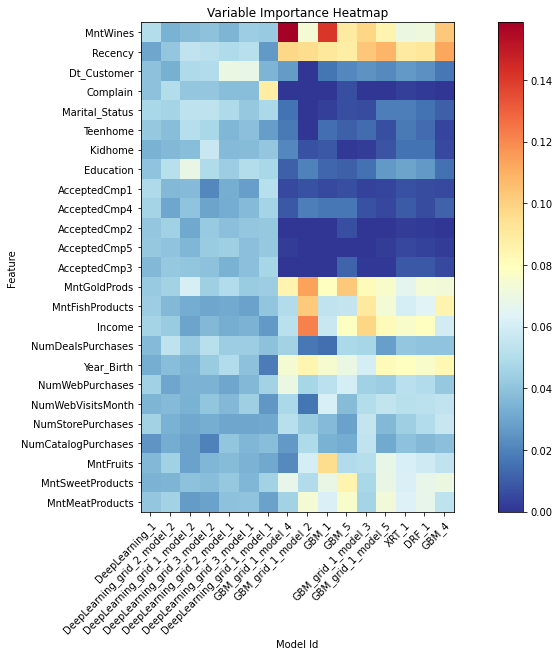

In [68]:
va_plot = aml.varimp_heatmap()

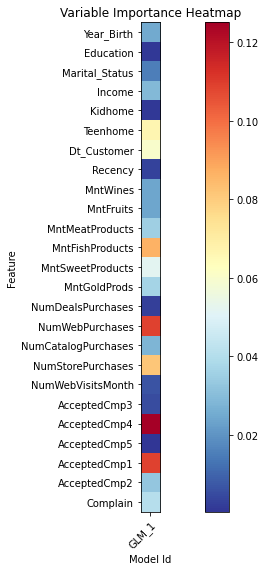

In [69]:
va_plot = h2o.varimp_heatmap(aml.leaderboard.sort("mse").head(10))

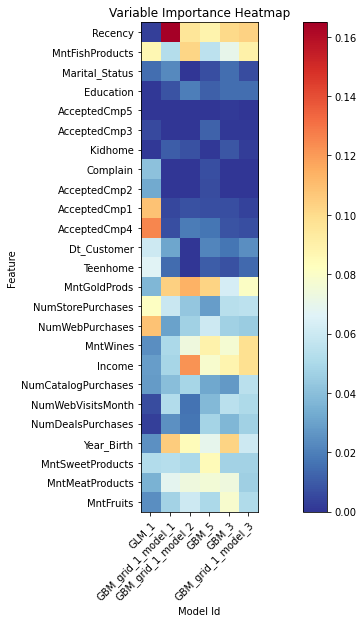

In [70]:
va_plot = h2o.varimp_heatmap(h2o.automl.get_leaderboard(aml, extra_columns="training_time_ms").\
                             sort("training_time_ms").head(10))

In [71]:
# how to reade a shap plot
#https://m.mage.ai/how-to-interpret-and-explain-your-machine-learning-models-using-shap-values-471c2635b78e

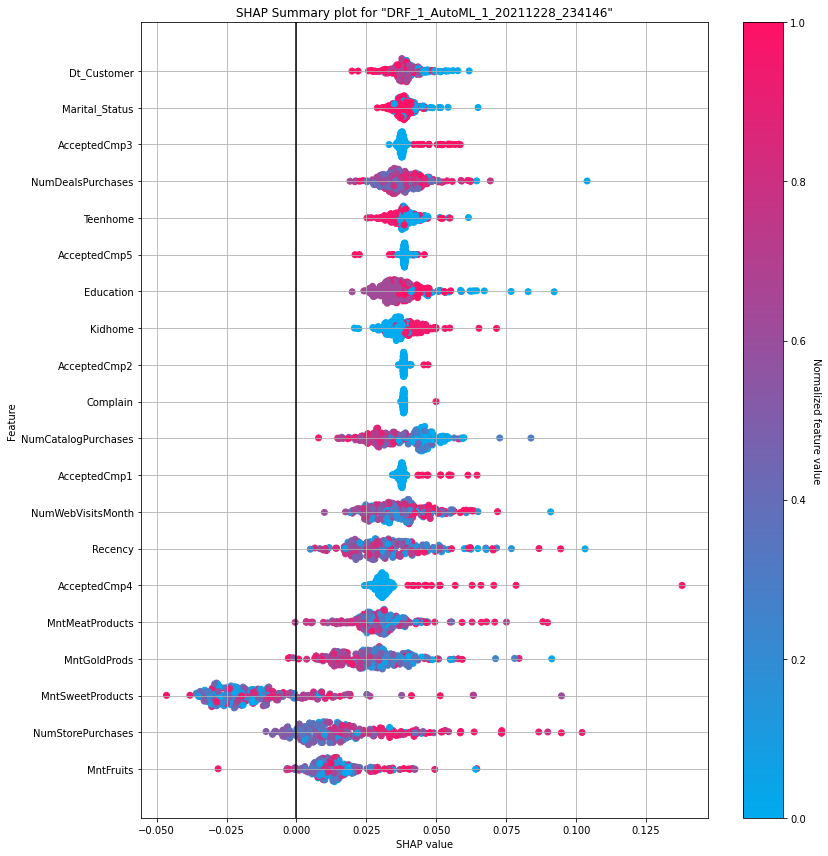

In [72]:
shap_plot = model_features.shap_summary_plot(test)

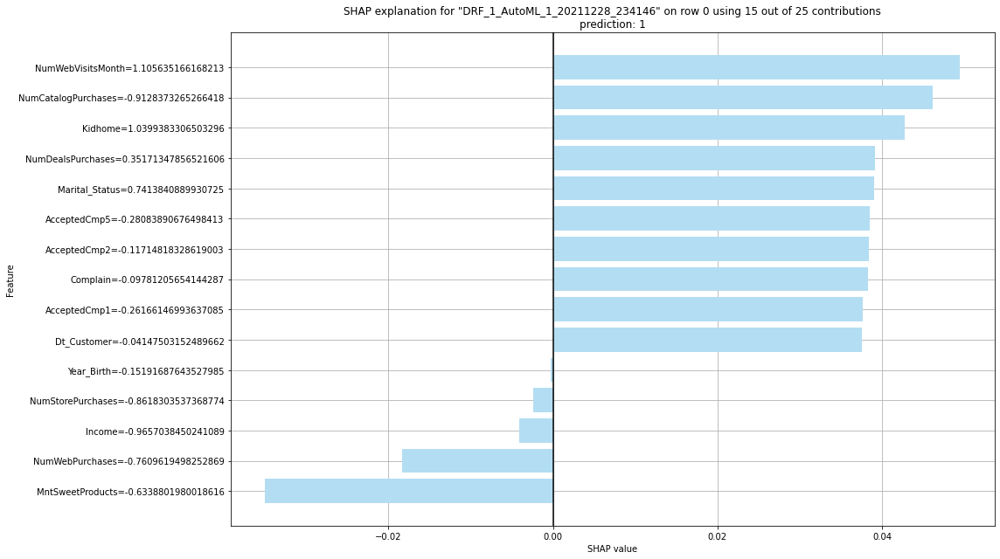

In [95]:
shapr_plot = model_features.shap_explain_row_plot(test, row_index=0)

<h3> Partial Depandance plots<br></h3>
    <a>https://christophm.github.io/interpretable-ml-book/pdp.html</a>
    <br>

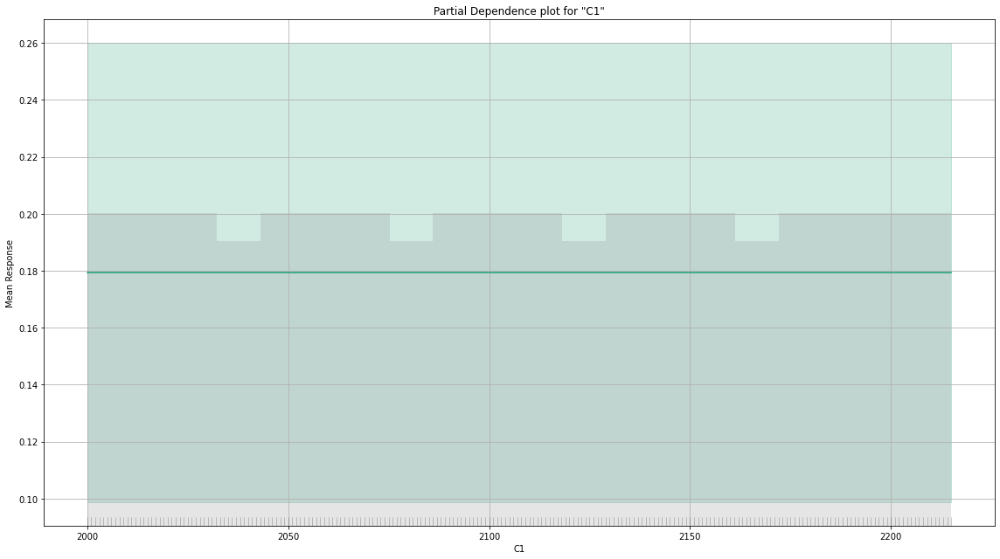

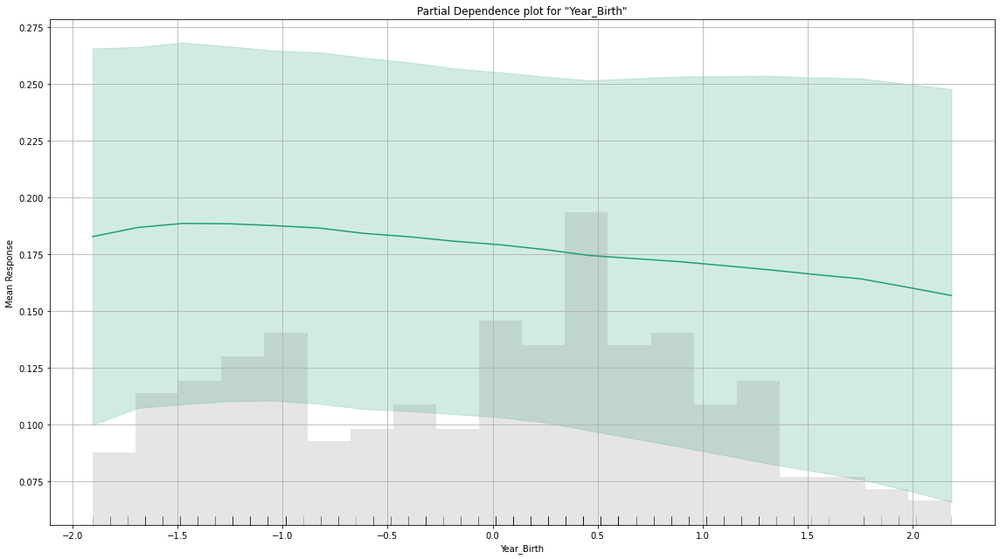

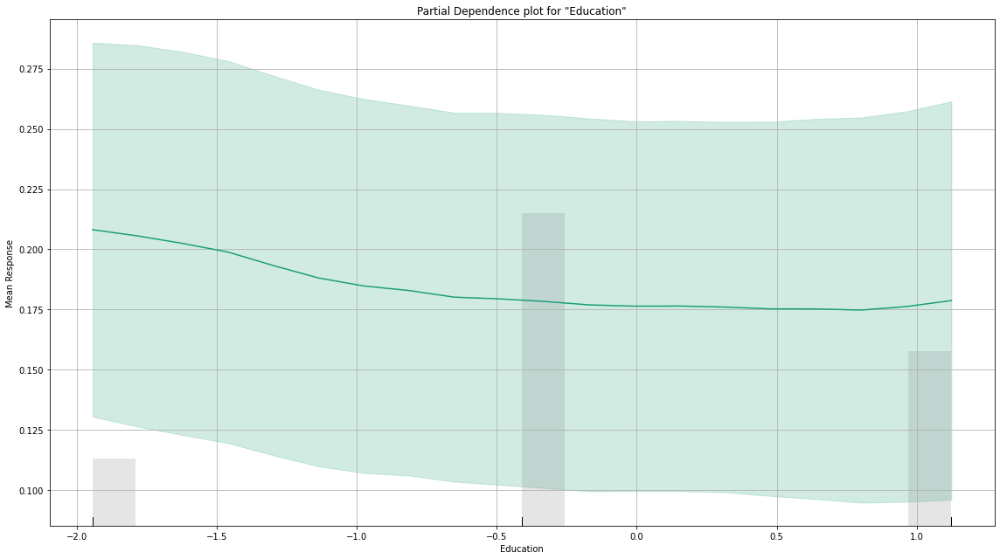

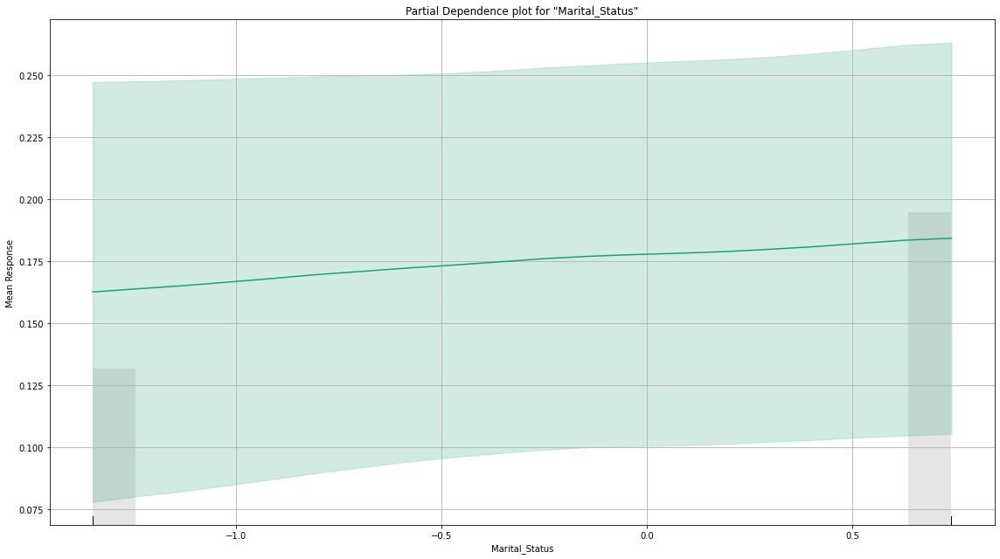

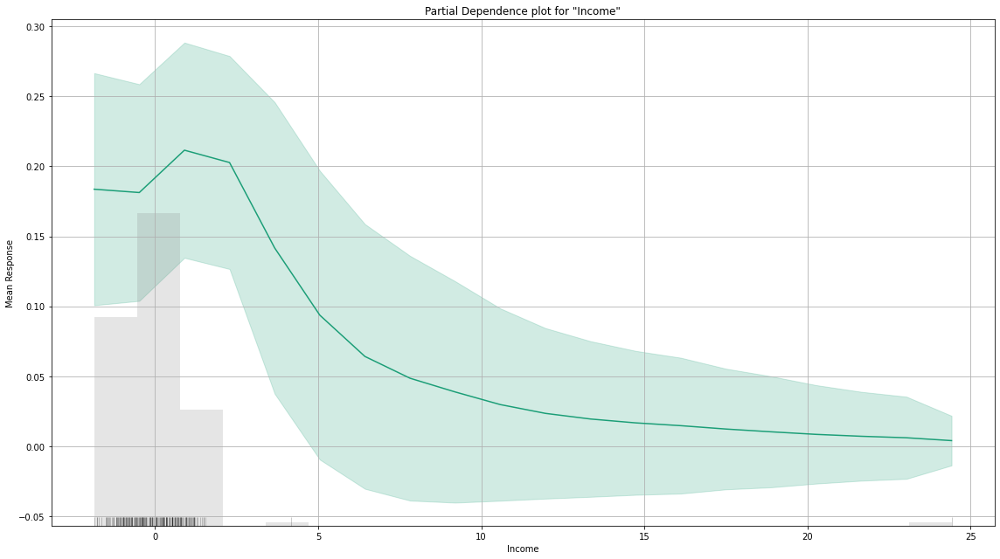

...

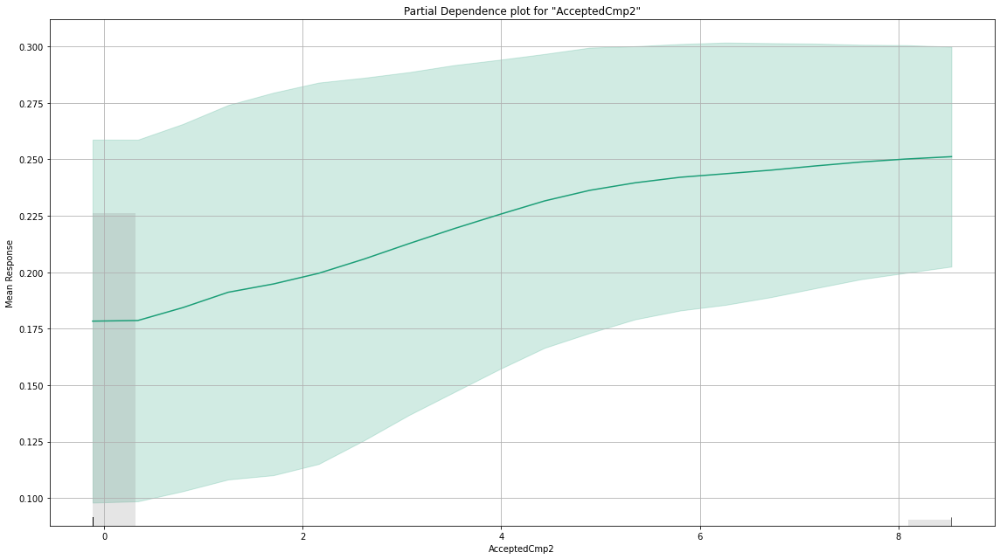

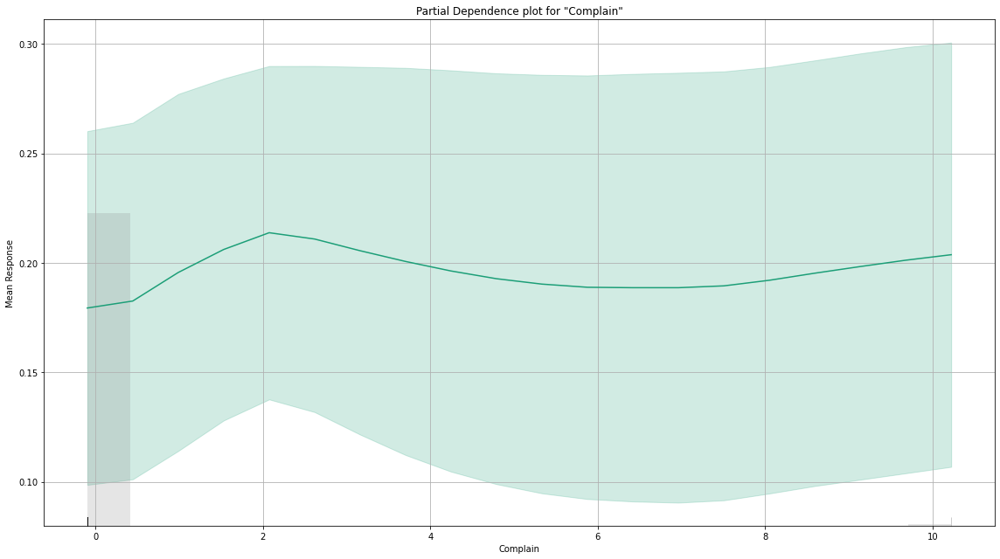

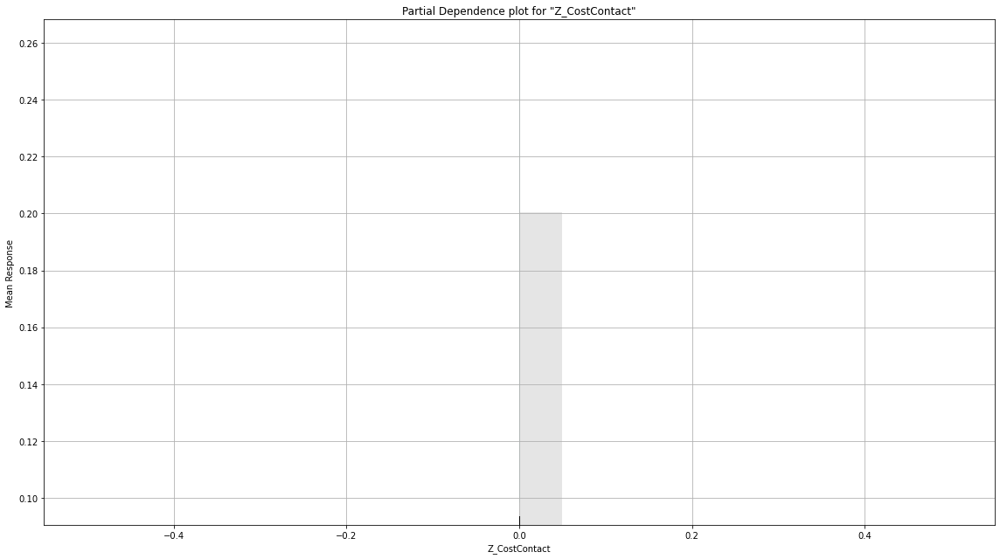

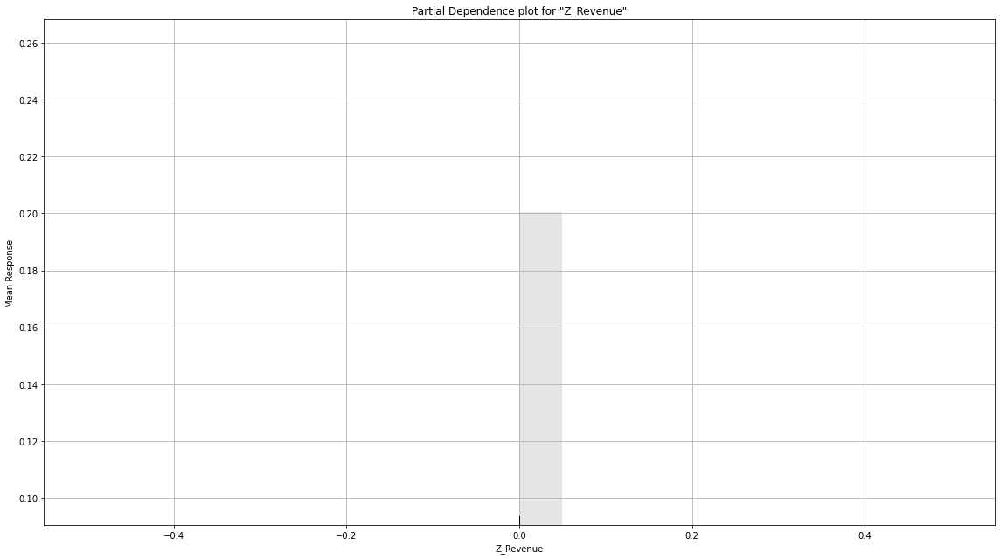

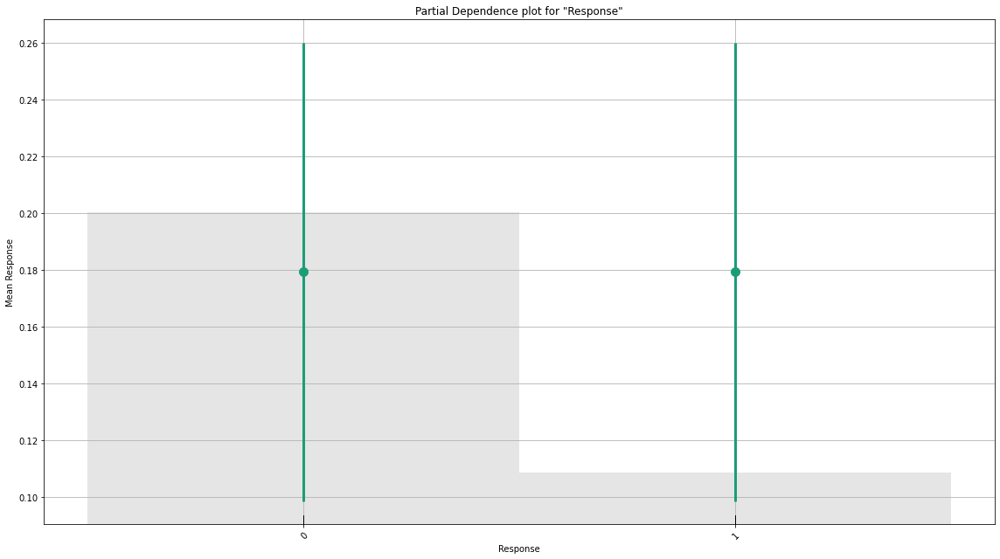

In [96]:
for col in train.columns:
    pd_plot = model_no1.pd_plot(test, col)

In [ ]:
# PLEASE READ Model explainability on H2o https://docs.h2o.ai/h2o/latest-stable/h2o-docs/explain.html

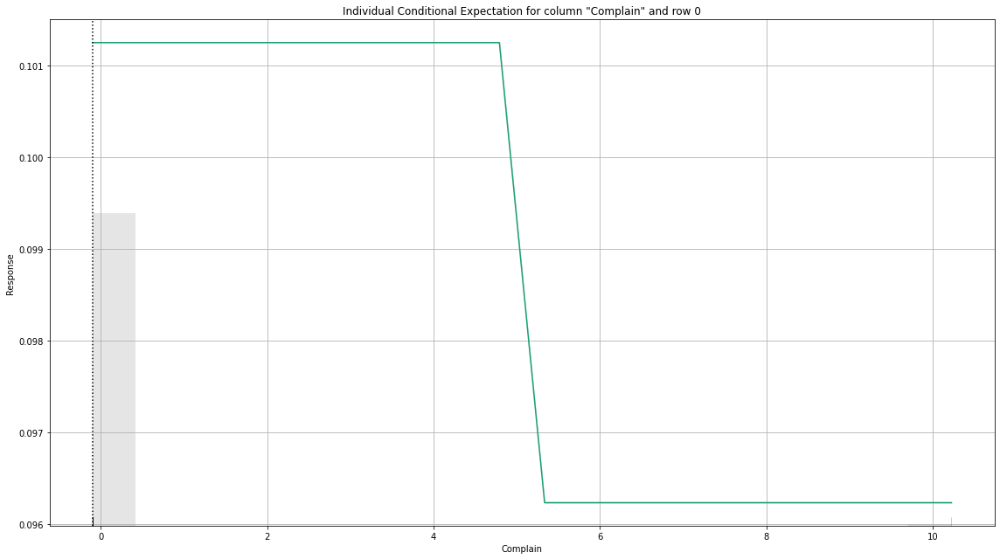

In [97]:
pd_plot = model_features.pd_plot(test, 'Complain', row_index=0)

MODEL INPSECTION

In [98]:
#https://scikit-learn.org/stable/auto_examples/inspection/plot_partial_dependence.html

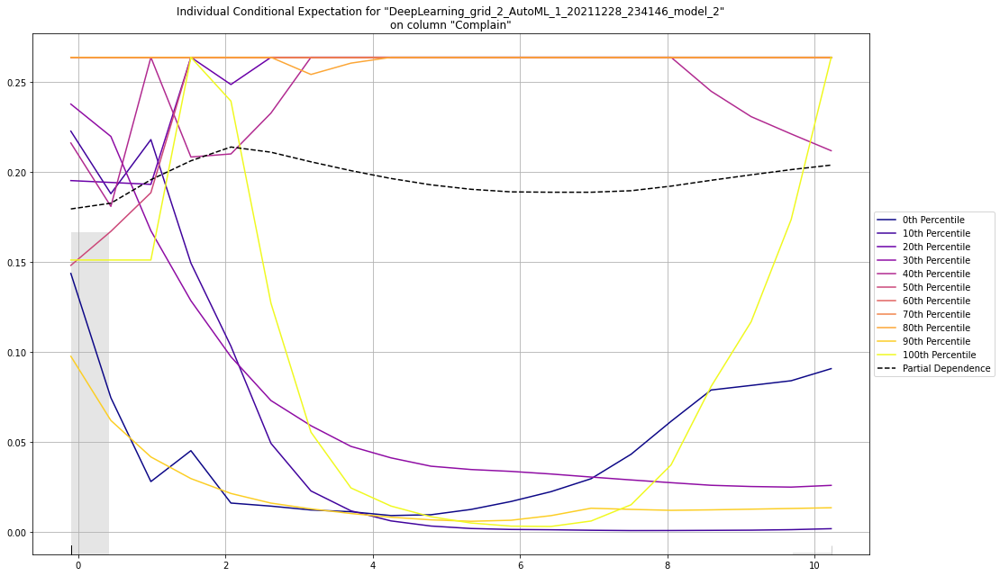

In [99]:
ice_plot = model.ice_plot(test, 'Complain')

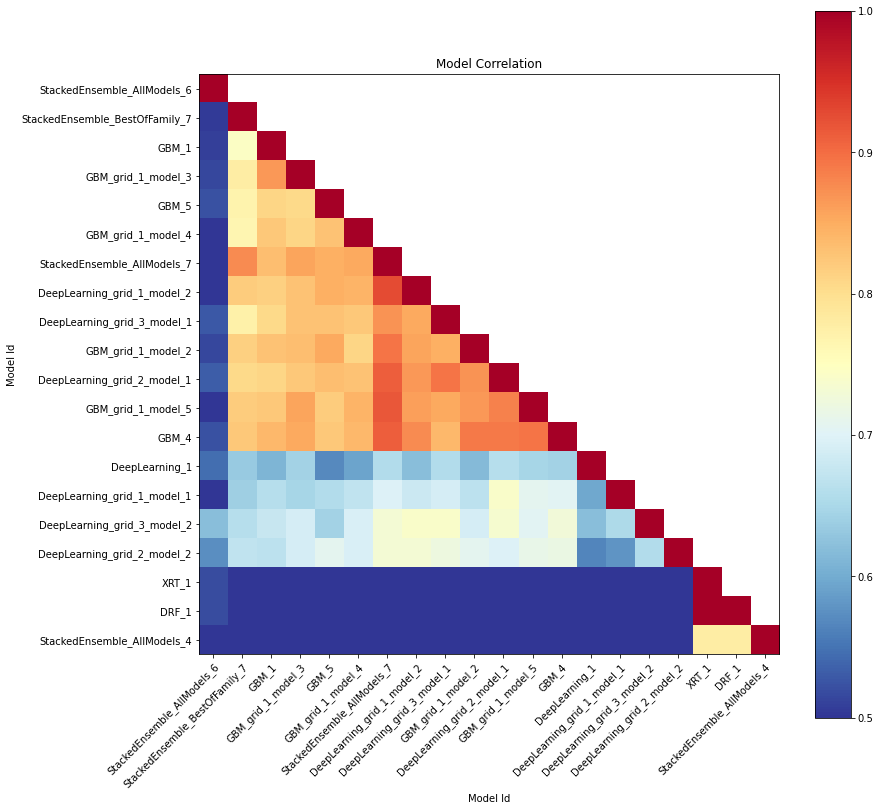

In [102]:
mc_plot = aml.model_correlation_heatmap(test)

<br>
<h1> Multi class example H2o from documentation

In [117]:
f = "https://h2o-public-test-data.s3.amazonaws.com/smalldata/wine/winequality-redwhite-no-BOM.csv"
df = h2o.import_file("https://h2o-public-test-data.s3.amazonaws.com/smalldata/wine/winequality-redwhite-no-BOM.csv")

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [118]:
# Reponse column
y = "quality"

In [119]:
# Split into train & test
splits = df.split_frame(ratios = [0.8], seed = 1)
train = splits[0]
test = splits[1]

In [120]:
# Run AutoML for 1 minute
aml = H2OAutoML(max_runtime_secs=60, seed=1)
aml.train(y=y, training_frame=train)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%
Model Details
H2OStackedEnsembleEstimator :  Stacked Ensemble
Model Key:  StackedEnsemble_BestOfFamily_3_AutoML_2_20211230_175021

No model summary for this model

ModelMetricsRegressionGLM: stackedensemble
** Reported on train data. **

MSE: 0.05180533816923882
RMSE: 0.22760786051724755
MAE: 0.16349490067527742
RMSLE: 0.034882379228160856
R^2: 0.9324939963286618
Mean Residual Deviance: 0.05180533816923882
Null degrees of freedom: 5204
Residual degrees of freedom: 5200
Null deviance: 3994.4119116234456
Residual deviance: 269.64678517088805
AIC: -625.0140038910839

ModelMetricsRegressionGLM: stackedensemble
** Reported on cross-validation data. **

MSE: 0.3802122468330119
RMSE: 0.6166135311789808
MAE: 0.44292263189519565
RMSLE: 0.09352223430902856
R^2: 0.5045566685280808
Mean Residual Deviance: 0.3802122468330119
Null degrees of freedom: 5204
Residual degrees of freedom: 5200
Null deviance: 39

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

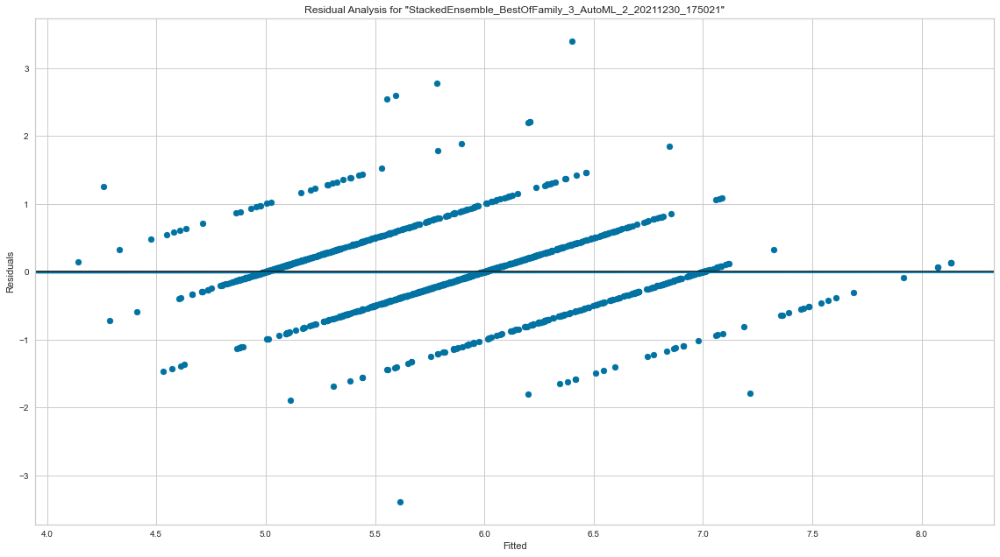

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

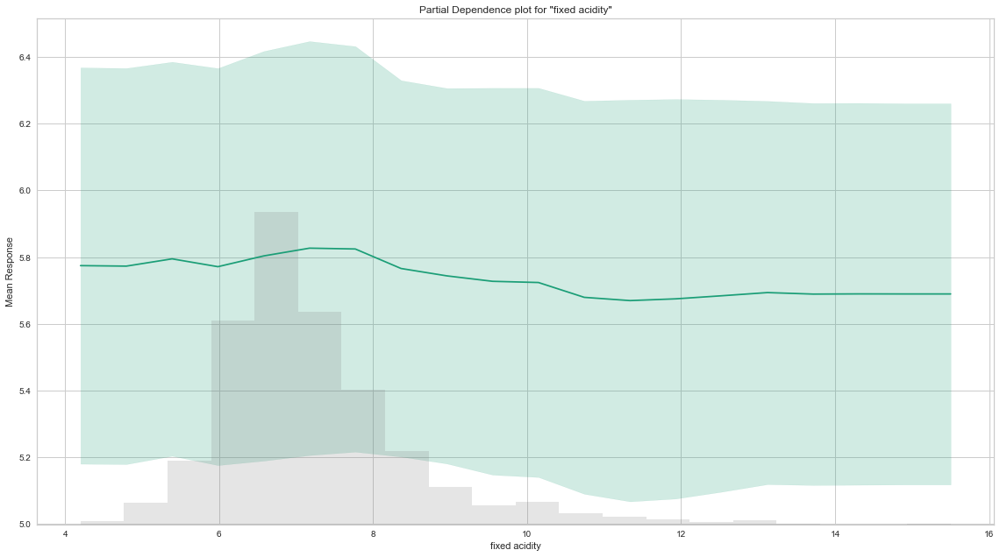

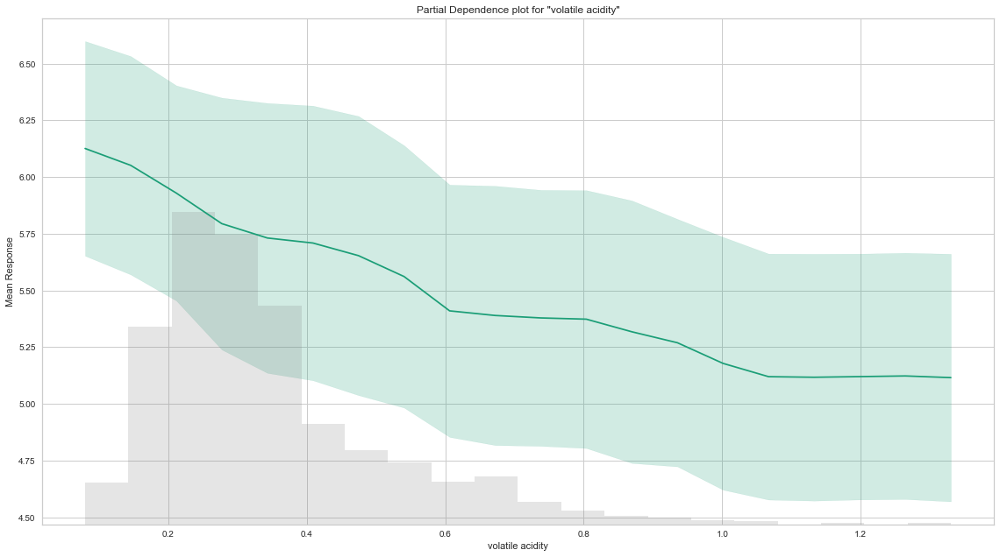

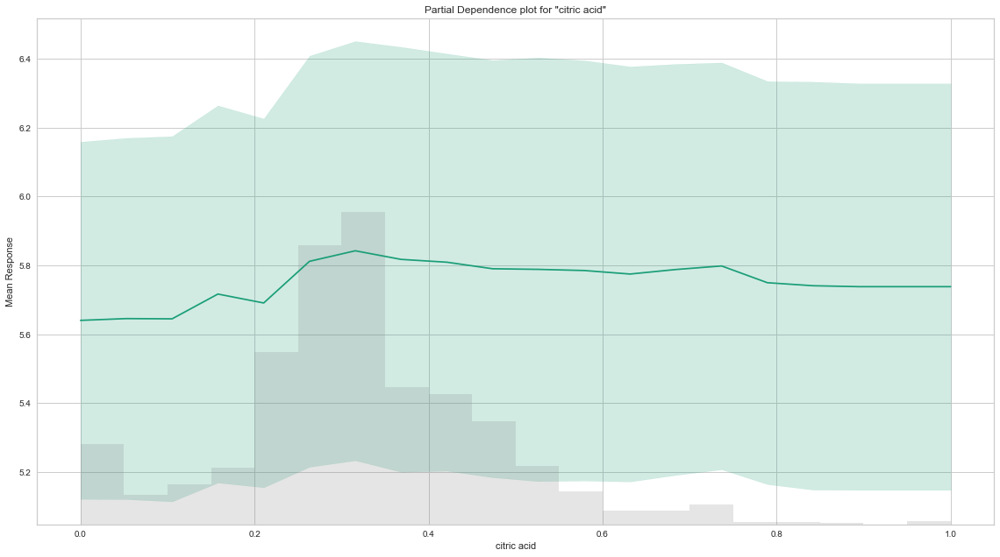

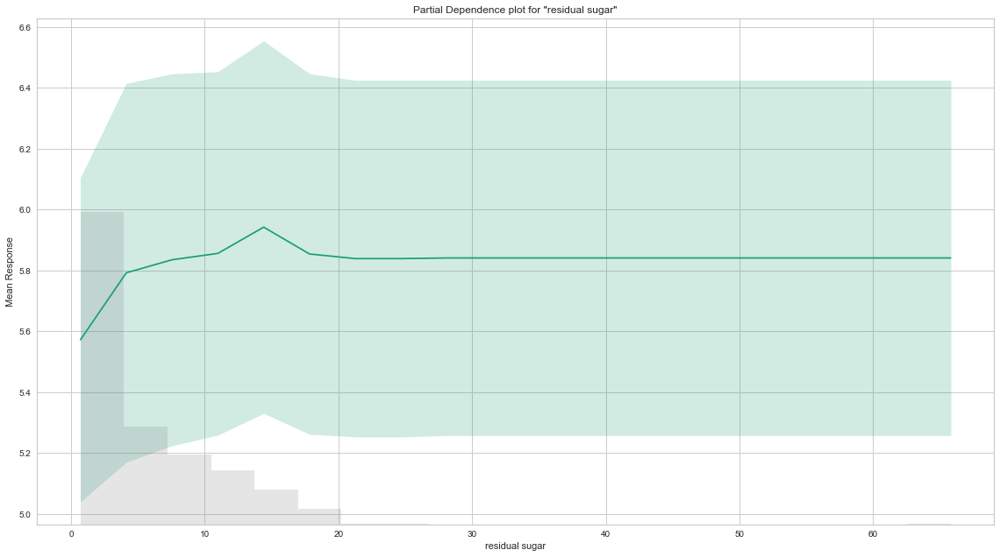

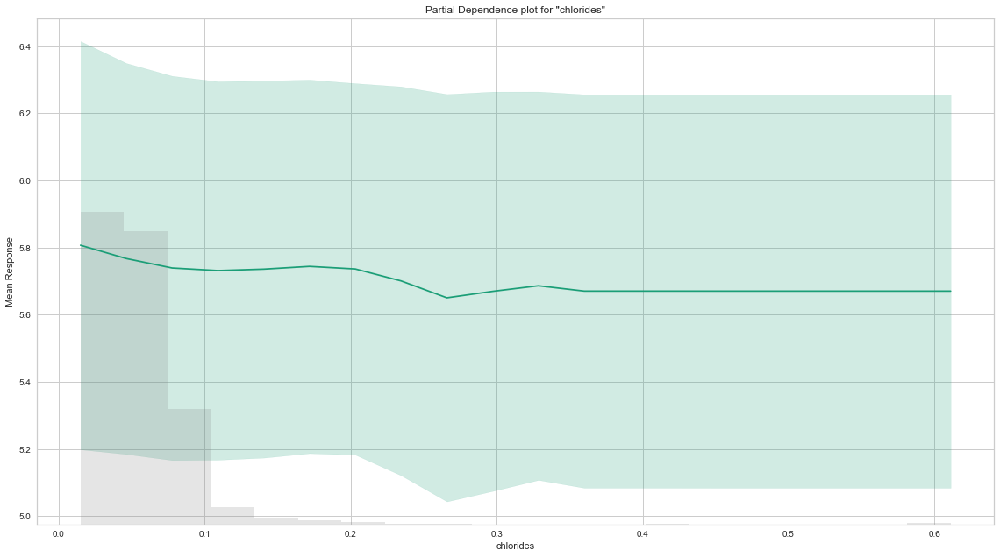

...

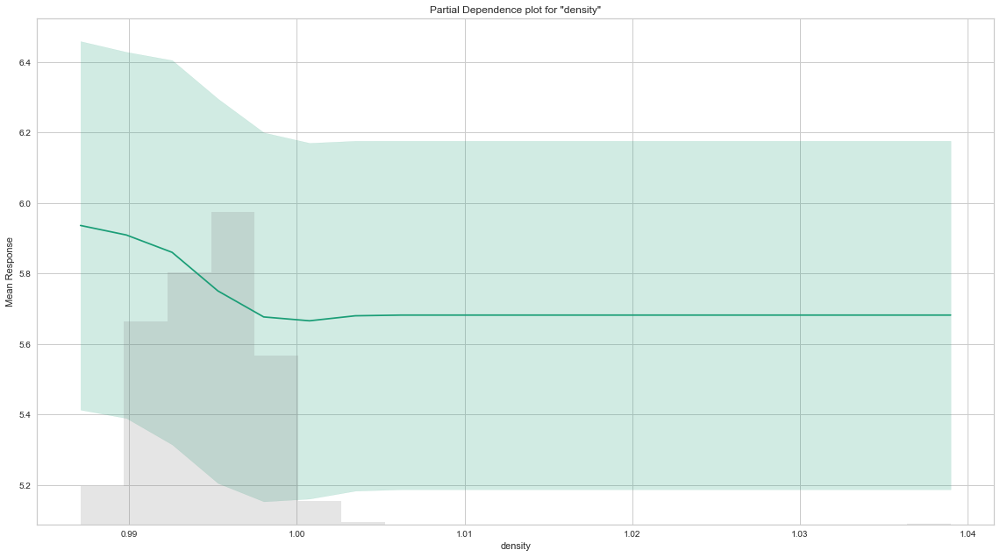

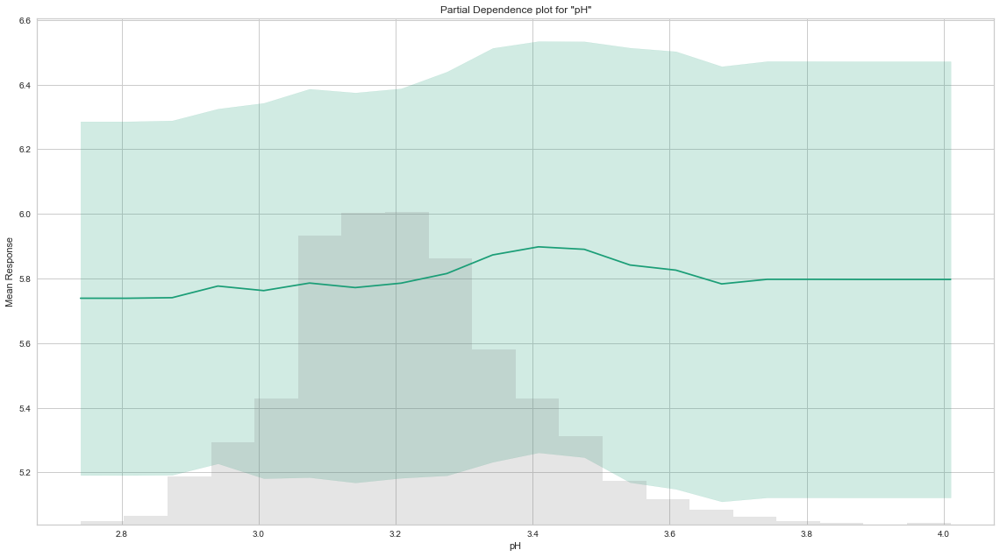

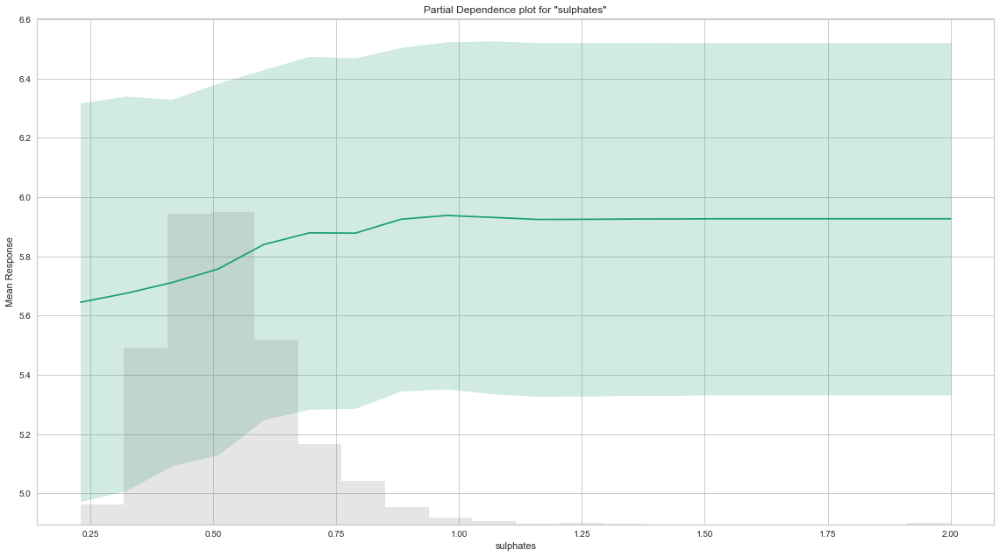

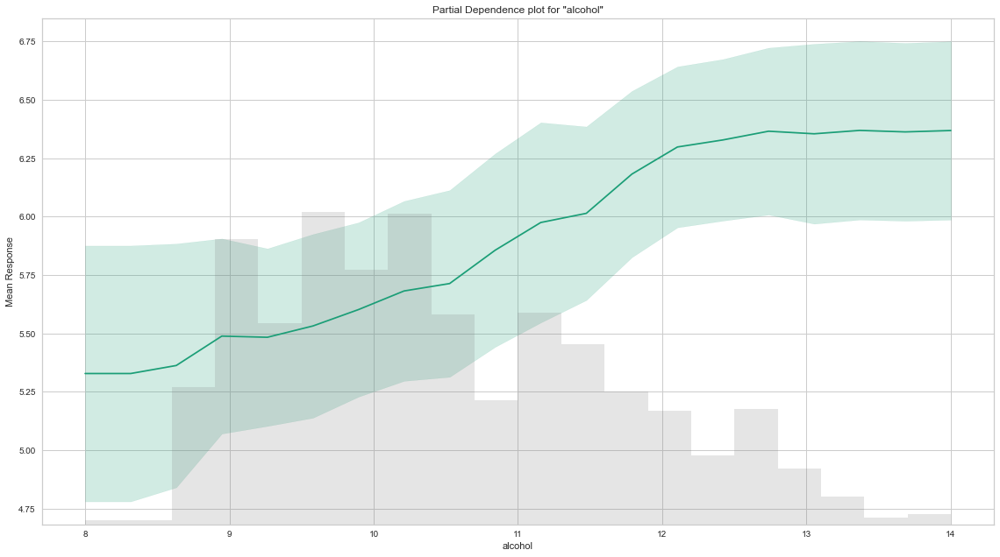

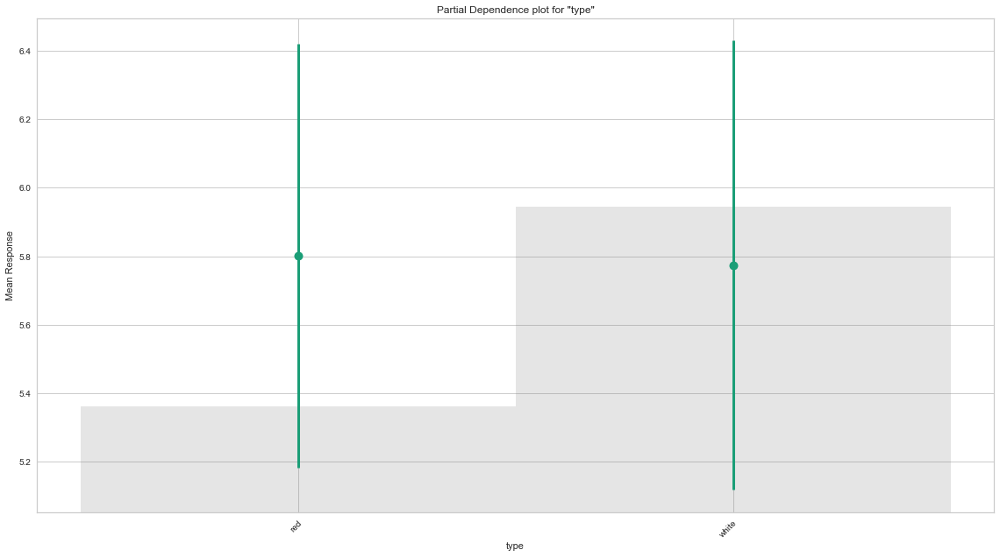

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

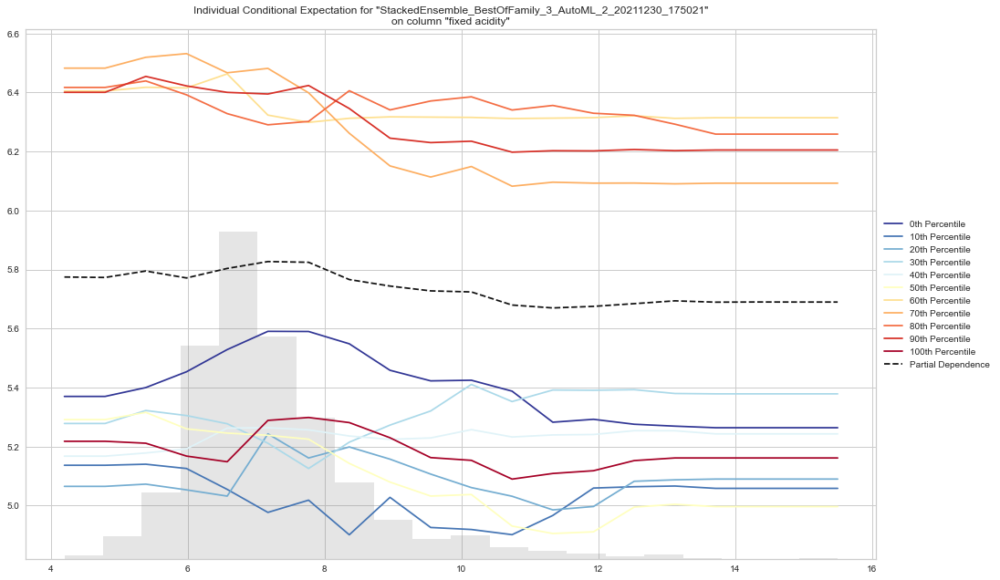

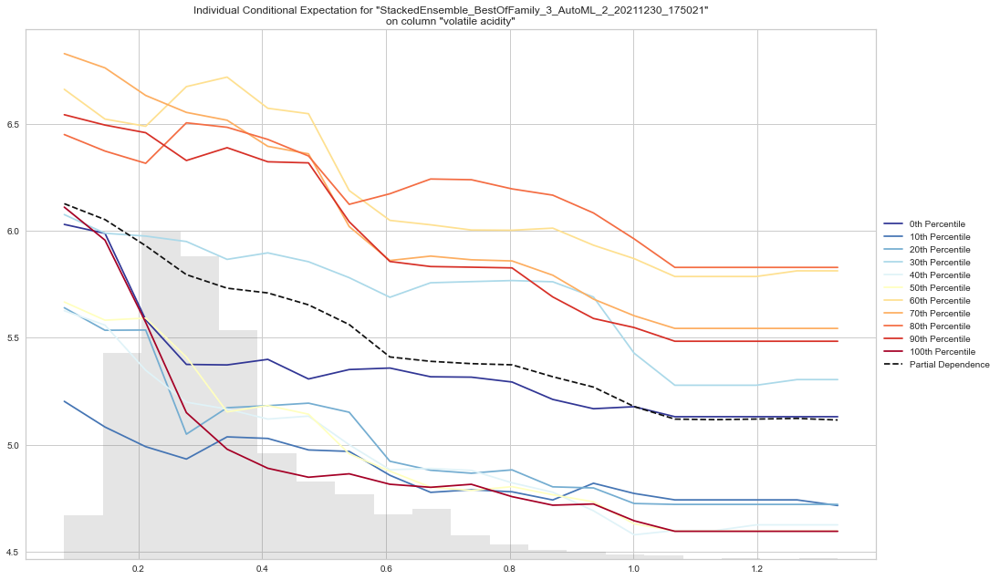

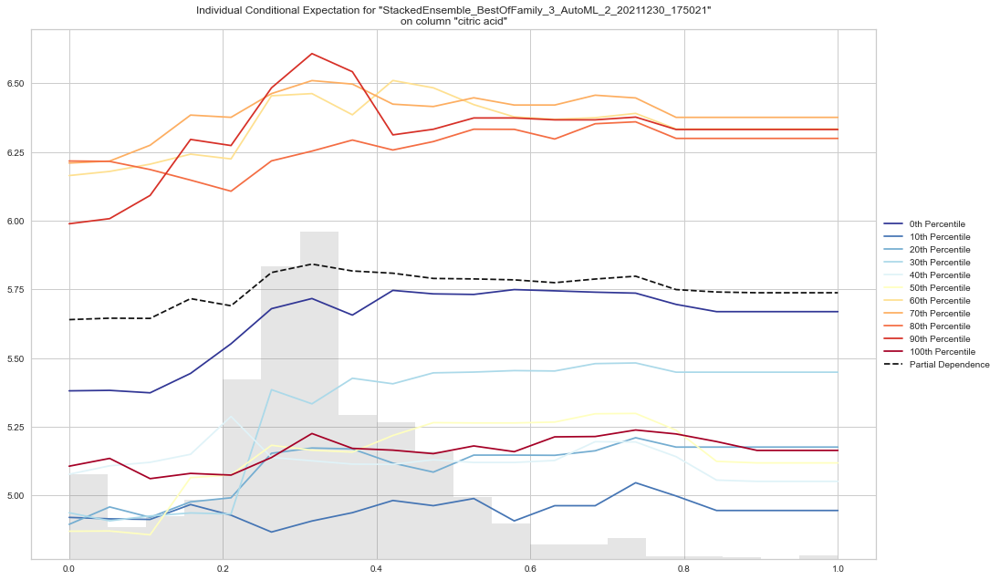

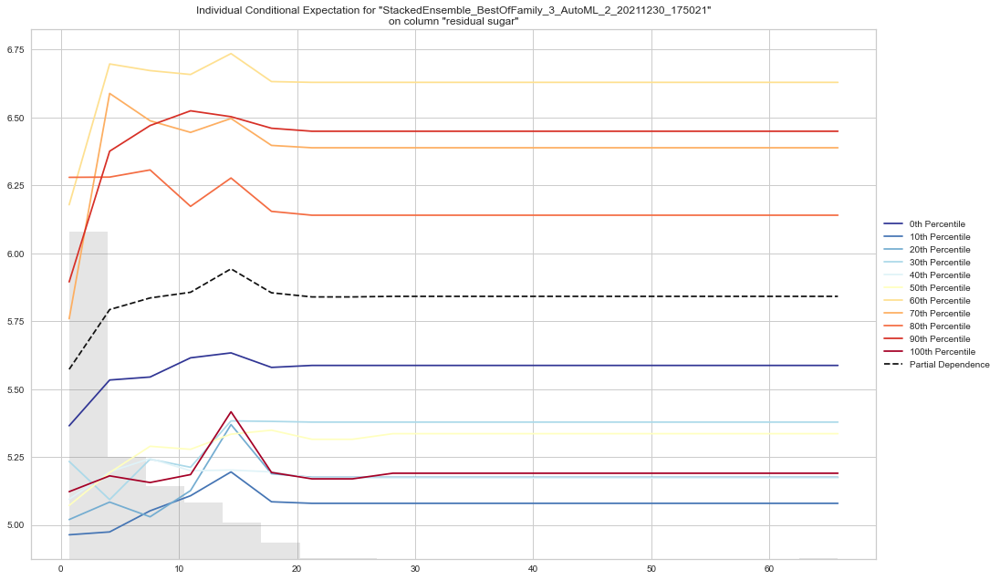

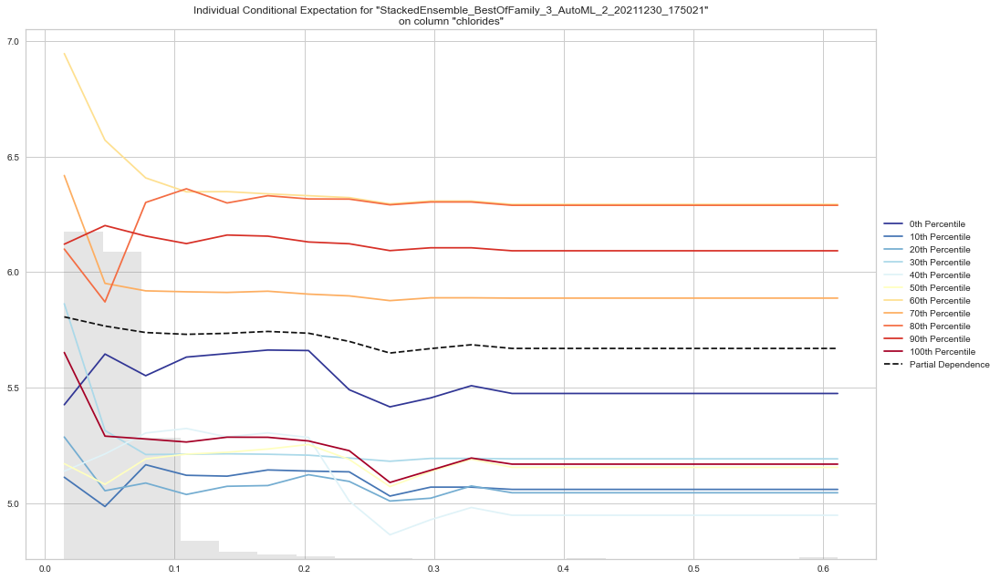

...

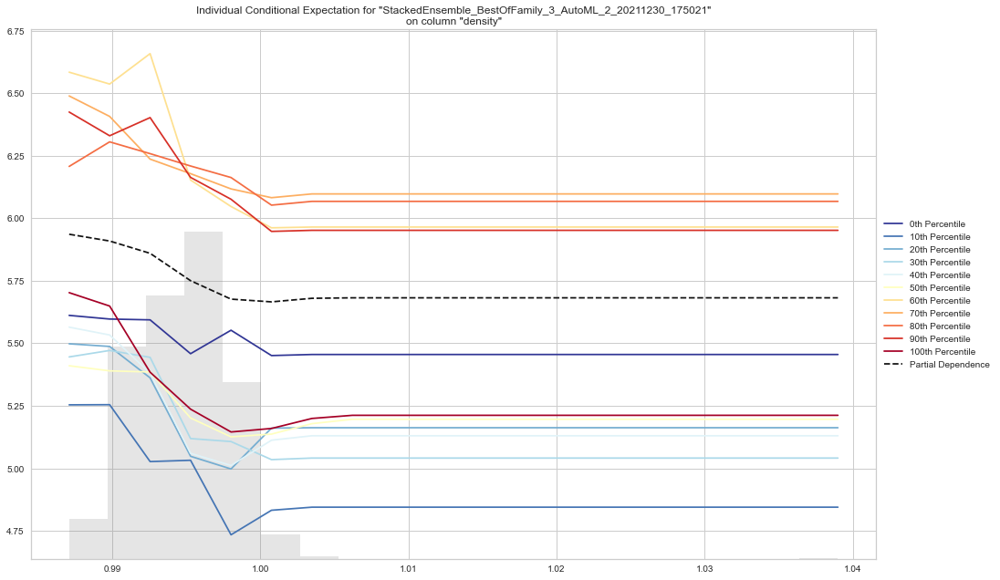

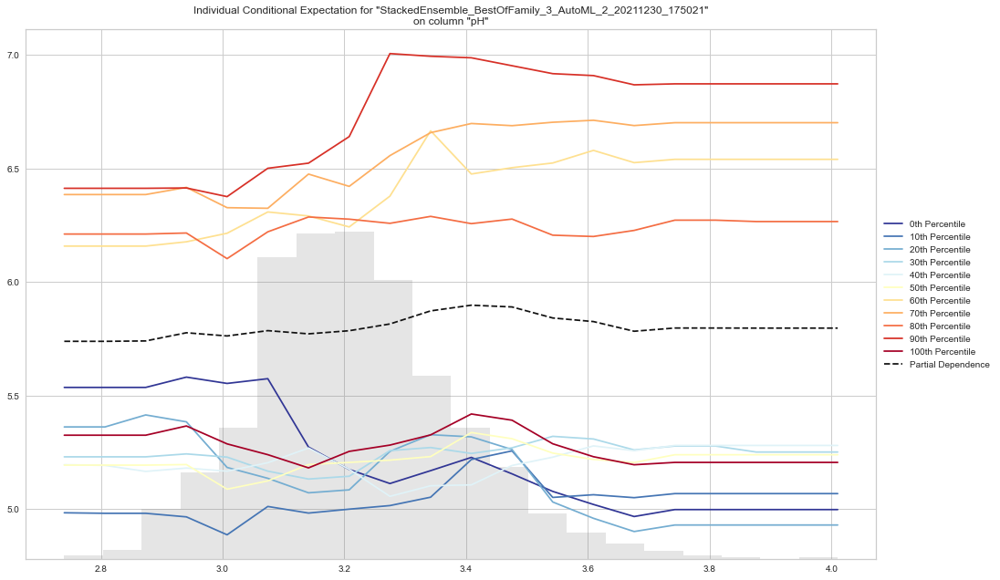

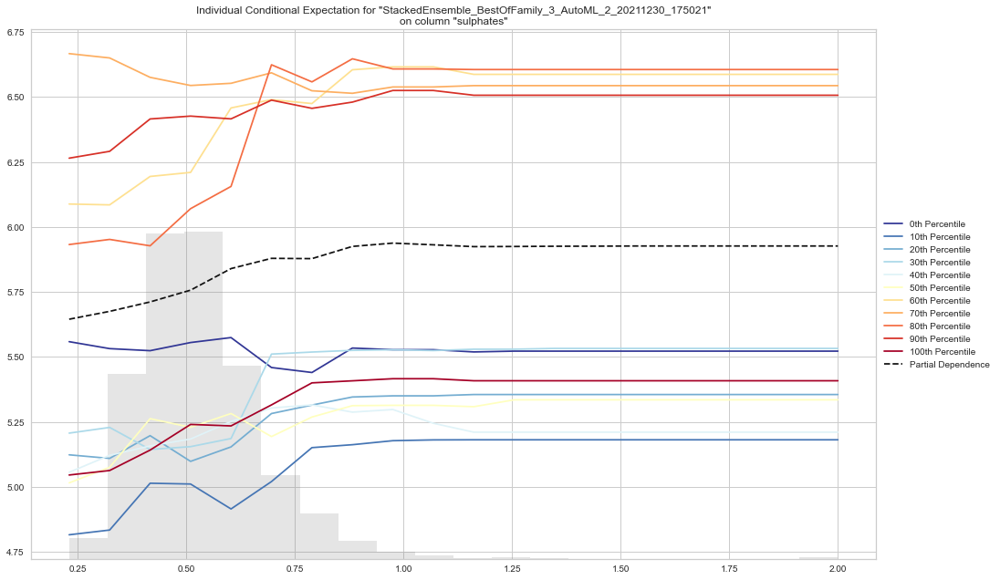

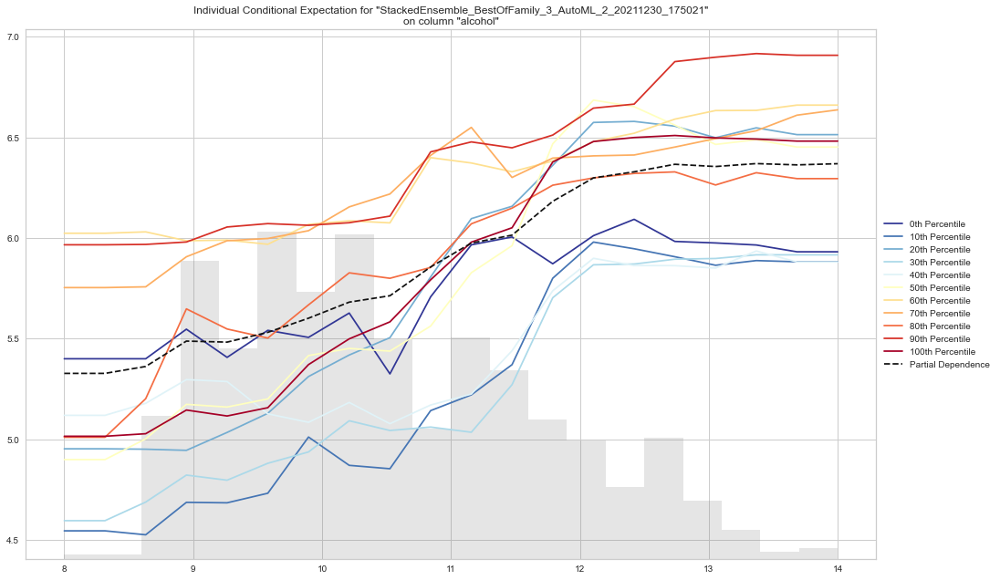

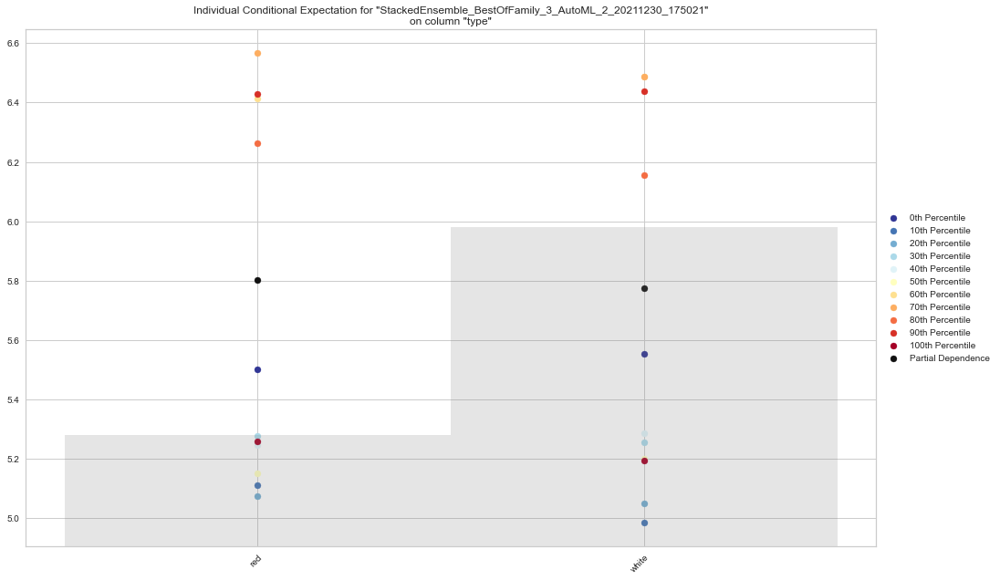

In [121]:
# Explain a single H2O model (e.g. leader model from AutoML)
exm = aml.leader.explain(test)

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

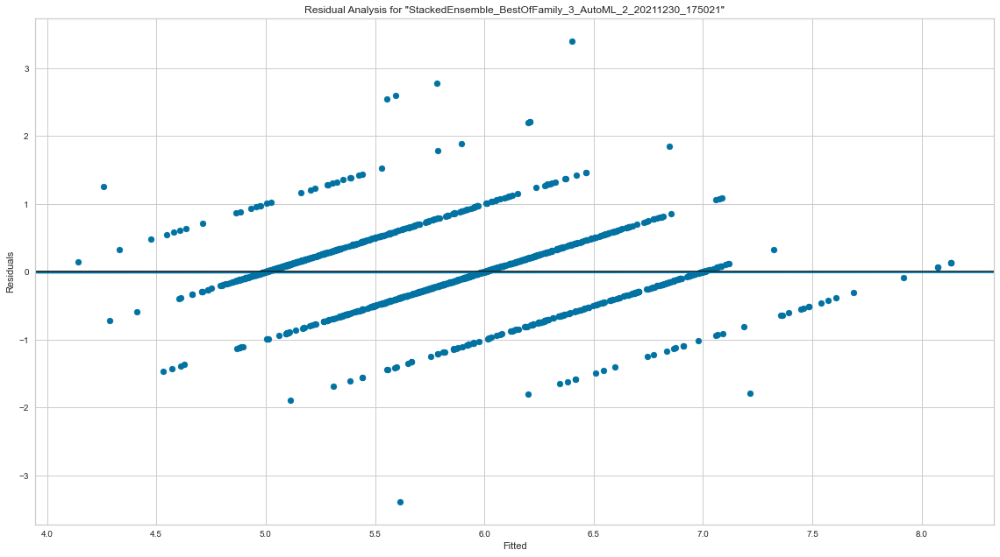

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

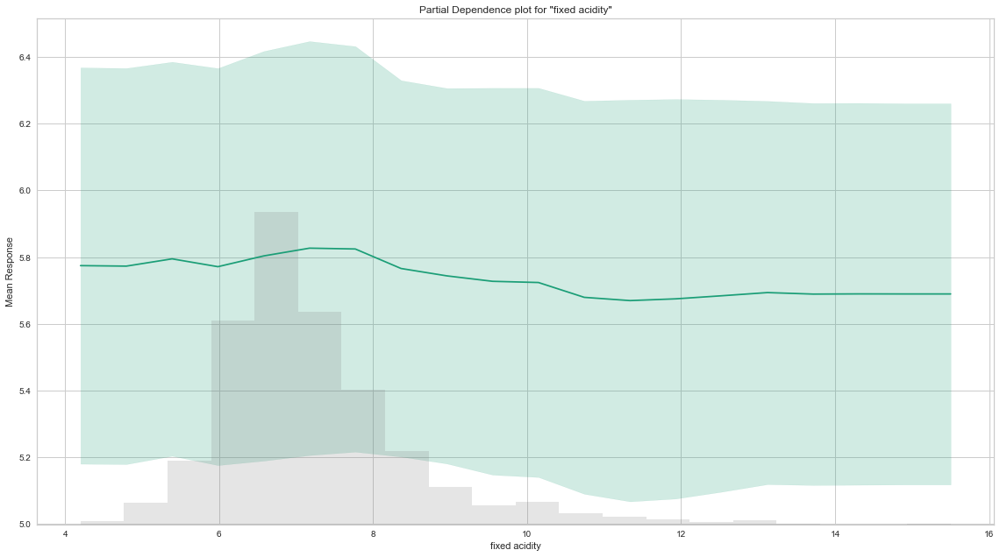

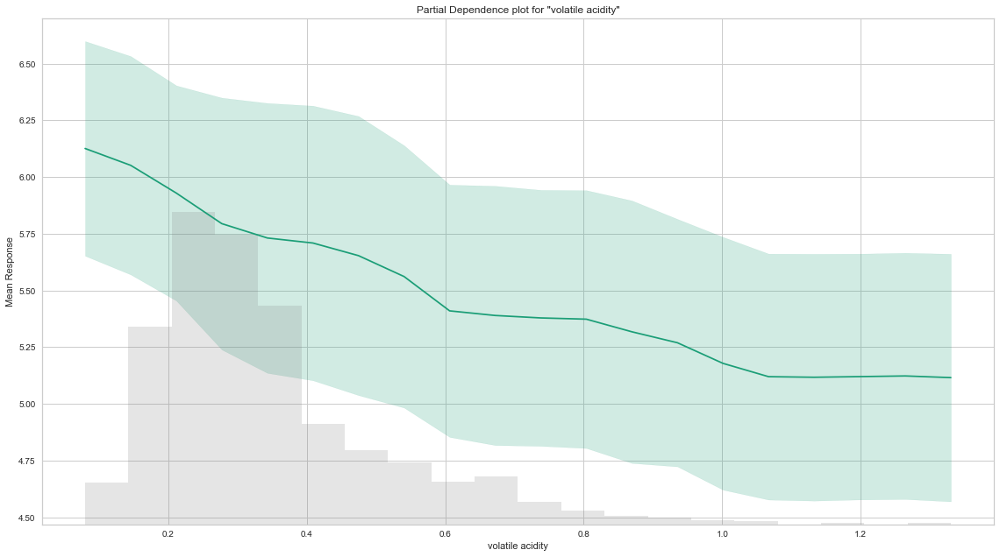

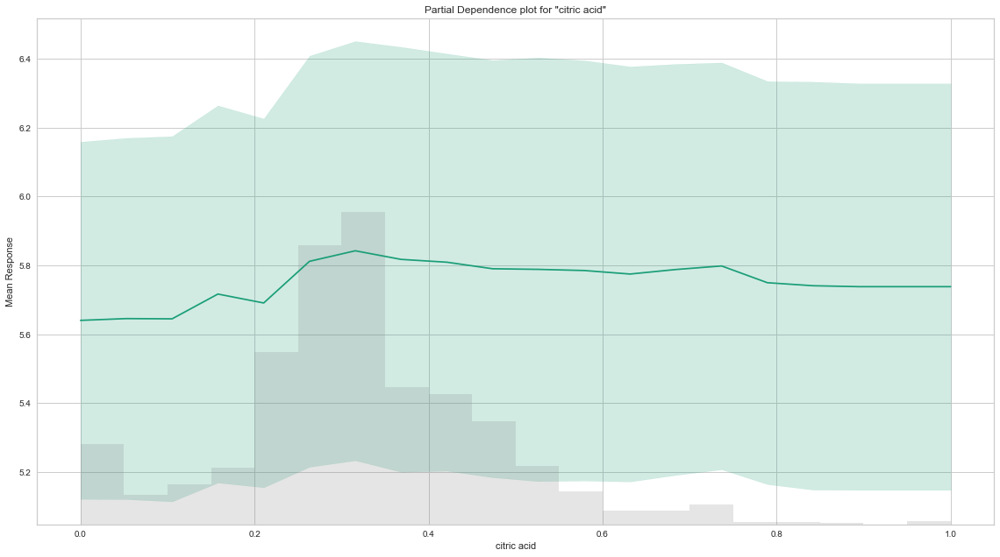

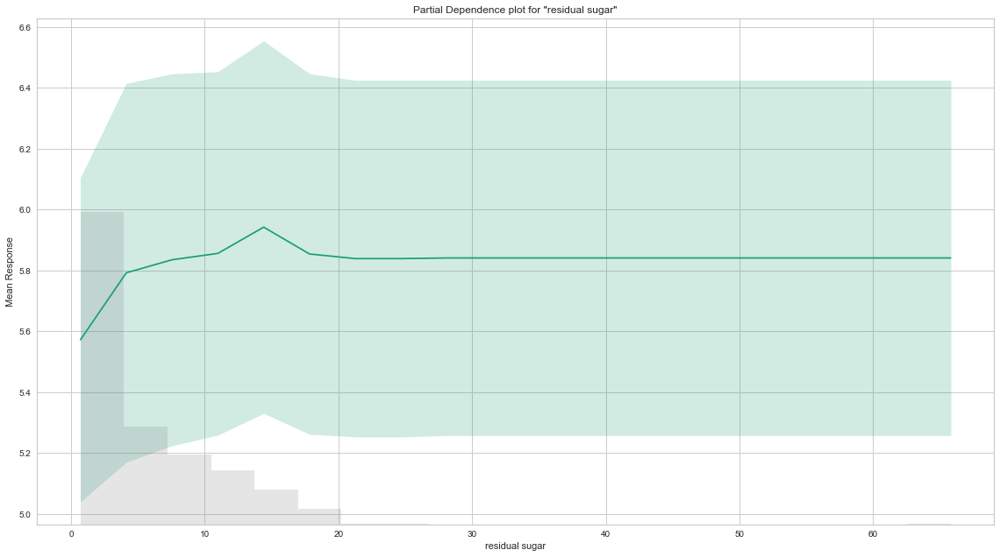

KeyboardInterrupt: 

In [123]:
# Explain leader model & compare with all AutoML models
exm = aml.leader.explain(test)

<H1>EVALML</h1>
<a>https://evalml.alteryx.com/en/stable/index.html</a>
    <BR><BR>

In [74]:
#!pip install evalml

In [75]:
import evalml

2021-12-29 00:30:29,660 featuretools - WARNING    Featuretools failed to load plugin nlp_primitives from library nlp_primitives. For a full stack trace, set logging to debug.


In [76]:
data=pd.read_csv('marketing_campaign.csv',delimiter='\t')

In [77]:
data=autohelper.cleandata.cleaning(data)

In [78]:
#data=autohelper.scaling(data)

In [79]:
data.head(3)

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,1957,1,0,58138.0,0,0,2012,58,635,88,...,7,0,0,0,0,0,0,3,11,1
1,1954,1,0,46344.0,1,1,2014,38,11,1,...,5,0,0,0,0,0,0,3,11,0
2,1965,1,1,71613.0,0,0,2013,26,426,49,...,4,0,0,0,0,0,0,3,11,0


In [80]:
X=data.drop('Response',axis=1)
y=data['Response']

In [81]:
X.head()

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue
0,1957,1,0,58138.0,0,0,2012,58,635,88,...,4,7,0,0,0,0,0,0,3,11
1,1954,1,0,46344.0,1,1,2014,38,11,1,...,2,5,0,0,0,0,0,0,3,11
2,1965,1,1,71613.0,0,0,2013,26,426,49,...,10,4,0,0,0,0,0,0,3,11
3,1984,1,1,26646.0,1,0,2014,26,11,4,...,4,6,0,0,0,0,0,0,3,11
4,1981,2,1,58293.0,1,0,2014,94,173,43,...,6,5,0,0,0,0,0,0,3,11


In [82]:
y.value_counts(normalize=True)

0    0.849729
1    0.150271
Name: Response, dtype: float64

In [83]:
evalml.problem_types.ProblemTypes.all_problem_types

[<ProblemTypes.BINARY: 'binary'>,
 <ProblemTypes.MULTICLASS: 'multiclass'>,
 <ProblemTypes.REGRESSION: 'regression'>,
 <ProblemTypes.TIME_SERIES_REGRESSION: 'time series regression'>,
 <ProblemTypes.TIME_SERIES_BINARY: 'time series binary'>,
 <ProblemTypes.TIME_SERIES_MULTICLASS: 'time series multiclass'>]

In [84]:
#use evalml train test split

In [85]:
X_train,X_test,y_train,y_test=evalml.preprocessing.split_data(X,y,problem_type='binary')

In [86]:
X_train.head()

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue
261,1968,2,0,69674.0,0,2,2013,46,554,41,...,10,5,0,0,0,0,0,0,3,11
725,1966,1,1,44794.0,0,1,2014,99,54,0,...,3,6,0,0,0,0,0,0,3,11
806,1971,2,1,56850.0,0,1,2014,83,34,1,...,3,2,0,0,0,0,0,0,3,11
1907,1986,1,1,33235.0,1,0,2014,71,45,0,...,3,7,0,0,0,0,0,0,3,11
1908,1959,1,1,35701.0,0,0,2013,36,21,1,...,3,6,0,0,0,0,0,0,3,11


In [87]:
from evalml import AutoMLSearch

In [88]:
automl=AutoMLSearch(X_train=X_train,y_train=y_train,problem_type='binary',max_batches=1,optimize_thresholds=True)

In [89]:
automl.search()

In [90]:
automl.rankings

,id,pipeline_name,search_order,mean_cv_score,standard_deviation_cv_score,validation_score,percent_better_than_baseline,high_variance_cv,parameters
0,1,Elastic Net Classifier w/ Label Encoder + Imputer + Oversampler + ...,1,0.279504,0.019160,0.267652,94.609052,False,"{'Label Encoder': {'positive_label': None}, 'Imputer': {'categoric..."
1,2,Logistic Regression Classifier w/ Label Encoder + Imputer + Oversa...,2,0.279643,0.019116,0.267673,94.606372,False,"{'Label Encoder': {'positive_label': None}, 'Imputer': {'categoric..."
2,3,XGBoost Classifier w/ Label Encoder + Imputer + Oversampler,3,0.309298,0.038967,0.340670,94.034403,False,"{'Label Encoder': {'positive_label': None}, 'Imputer': {'categoric..."
3,6,Random Forest Classifier w/ Label Encoder + Imputer + Oversampler,6,0.312629,0.017768,0.327011,93.970158,False,"{'Label Encoder': {'positive_label': None}, 'Imputer': {'categoric..."
4,8,Extra Trees Classifier w/ Label Encoder + Imputer + Oversampler,8,0.317661,0.016334,0.321575,93.873107,False,"{'Label Encoder': {'positive_label': None}, 'Imputer': {'categoric..."
5,4,LightGBM Classifier w/ Label Encoder + Imputer + Oversampler,4,0.370743,0.065426,0.420330,92.849290,False,"{'Label Encoder': {'positive_label': None}, 'Imputer': {'categoric..."
6,5,CatBoost Classifier w/ Label Encoder + Imputer + Oversampler,5,0.522467,0.007071,0.525748,89.922894,False,"{'Label Encoder': {'positive_label': None}, 'Imputer': {'categoric..."
7,7,Decision Tree Classifier w/ Label Encoder + Imputer + Oversampler,7,1.946196,0.215638,2.094672,62.462683,False,"{'Label Encoder': {'positive_label': None}, 'Imputer': {'categoric..."
8,0,Mode Baseline Binary Classification Pipeline,0,5.184696,0.028709,5.201271,0.000000,False,"{'Label Encoder': {'positive_label': None}, 'Baseline Classifier':..."


In [91]:
automl.best_pipeline

pipeline = BinaryClassificationPipeline(component_graph={'Label Encoder': ['Label Encoder', 'X', 'y'], 'Imputer': ['Imputer', 'X', 'Label Encoder.y'], 'Oversampler': ['Oversampler', 'Imputer.x', 'Label Encoder.y'], 'Standard Scaler': ['Standard Scaler', 'Oversampler.x', 'Oversampler.y'], 'Elastic Net Classifier': ['Elastic Net Classifier', 'Standard Scaler.x', 'Oversampler.y']}, parameters={'Label Encoder':{'positive_label': None}, 'Imputer':{'categorical_impute_strategy': 'most_frequent', 'numeric_impute_strategy': 'mean', 'categorical_fill_value': None, 'numeric_fill_value': None}, 'Oversampler':{'sampling_ratio': 0.25, 'k_neighbors_default': 5, 'n_jobs': -1, 'sampling_ratio_dict': None, 'k_neighbors': 5}, 'Elastic Net Classifier':{'penalty': 'elasticnet', 'C': 1.0, 'l1_ratio': 0.15, 'n_jobs': -1, 'multi_class': 'auto', 'solver': 'saga'}}, random_seed=0)

In [92]:
best_pipeline = automl.best_pipeline

In [93]:
automl.describe_pipeline(automl.rankings.iloc[0]["id"])


*************************************************************************************
* Elastic Net Classifier w/ Label Encoder + Imputer + Oversampler + Standard Scaler *
*************************************************************************************

Problem Type: binary
Model Family: Linear

Pipeline Steps
1. Label Encoder
	 * positive_label : None
2. Imputer
	 * categorical_impute_strategy : most_frequent
	 * numeric_impute_strategy : mean
	 * categorical_fill_value : None
	 * numeric_fill_value : None
3. Oversampler
	 * sampling_ratio : 0.25
	 * k_neighbors_default : 5
	 * n_jobs : -1
	 * sampling_ratio_dict : None
	 * k_neighbors : 5
4. Standard Scaler
5. Elastic Net Classifier
	 * penalty : elasticnet
	 * C : 1.0
	 * l1_ratio : 0.15
	 * n_jobs : -1
	 * multi_class : auto
	 * solver : saga

Training
Training for binary problems.
Total training time (including CV): 5.1 seconds

Cross Validation
----------------
             Log Loss Binary  MCC Binary  Gini   AUC  Precision

Make predictions and test accuracy

In [94]:
scores = best_pipeline.score(X_test, y_test,  objectives=evalml.objectives.get_core_objectives('binary'))
print(f'Accuracy Binary: {scores["Accuracy Binary"]}')

Accuracy Binary: 0.8513513513513513


<h1> AUTOML SKLEARN
    <br>

In [2]:
#Auto Ml from Sklearn needs these dependancies so it has to be intsalled

In [3]:
#!sudo apt-get install swig -y
#!pip install Cython numpy
#!pip install pipelineprofiler
#!pip install auto-sklearn

In [4]:
import pandas as pd
import numpy as np
import PipelineProfiler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from autosklearn.classification import AutoSklearnClassifier

In [5]:
auto=pd.read_csv('data_auto.csv')

In [6]:
auto=auto.drop(columns=['Unnamed: 0'])

In [7]:
auto.head()

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,1957,1,0,58138.0,0,0,2012,58,635,88,...,7,0,0,0,0,0,0,3,11,1
1,1954,1,0,46344.0,1,1,2014,38,11,1,...,5,0,0,0,0,0,0,3,11,0
2,1965,1,1,71613.0,0,0,2013,26,426,49,...,4,0,0,0,0,0,0,3,11,0
3,1984,1,1,26646.0,1,0,2014,26,11,4,...,6,0,0,0,0,0,0,3,11,0
4,1981,2,1,58293.0,1,0,2014,94,173,43,...,5,0,0,0,0,0,0,3,11,0


In [8]:
target_col = "Response"
X = auto.loc[:, auto.columns != target_col]
y = auto.loc[:, target_col]

In [9]:
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.20, 
                                                    random_state=2021)

In [10]:
model = AutoSklearnClassifier(
    time_left_for_this_task=3 * 60,
    per_run_time_limit=30,
    ensemble_size=1,
    initial_configurations_via_metalearning=0,
    n_jobs=-1,
)

In [11]:
model

AutoSklearnClassifier(ensemble_size=1,
                      initial_configurations_via_metalearning=0, n_jobs=-1,
                      per_run_time_limit=30, time_left_for_this_task=180)

In [12]:
model.fit(X_train, y_train)

AutoSklearnClassifier(ensemble_size=1,
                      initial_configurations_via_metalearning=0, n_jobs=-1,
                      per_run_time_limit=30, time_left_for_this_task=180)

In [13]:
y_pred = model.predict(X_test)

In [14]:
testing_accuracy = accuracy_score(y_test, y_pred)
print("Test Accuracy score {0}".format(testing_accuracy))

Test Accuracy score 0.8445945945945946


In [15]:
print(model.sprint_statistics())

auto-sklearn results:
  Dataset name: cf51f366-6860-11ec-b070-985aebde12c1
  Metric: accuracy
  Best validation score: 0.897436
  Number of target algorithm runs: 45
  Number of successful target algorithm runs: 40
  Number of crashed target algorithm runs: 4
  Number of target algorithms that exceeded the time limit: 1
  Number of target algorithms that exceeded the memory limit: 0



In [16]:
print(model.show_models())

[(1.000000, SimpleClassificationPipeline({'balancing:strategy': 'none', 'classifier:__choice__': 'random_forest', 'data_preprocessor:__choice__': 'feature_type', 'feature_preprocessor:__choice__': 'no_preprocessing', 'classifier:random_forest:bootstrap': 'True', 'classifier:random_forest:criterion': 'gini', 'classifier:random_forest:max_depth': 'None', 'classifier:random_forest:max_features': 0.5, 'classifier:random_forest:max_leaf_nodes': 'None', 'classifier:random_forest:min_impurity_decrease': 0.0, 'classifier:random_forest:min_samples_leaf': 1, 'classifier:random_forest:min_samples_split': 2, 'classifier:random_forest:min_weight_fraction_leaf': 0.0, 'data_preprocessor:feature_type:categorical_transformer:categorical_encoding:__choice__': 'one_hot_encoding', 'data_preprocessor:feature_type:categorical_transformer:category_coalescence:__choice__': 'minority_coalescer', 'data_preprocessor:feature_type:numerical_transformer:imputation:strategy': 'mean', 'data_preprocessor:feature_type:

In [17]:
profiler_data = PipelineProfiler.import_autosklearn(model)
PipelineProfiler.plot_pipeline_matrix(profiler_data)

In [116]:
#Residual Plot

<h2> Residual Plot</h2>
 <a>https://www.scikit-yb.org/en/latest/api/regressor/residuals.html

In [108]:
from yellowbrick.datasets import load_concrete
from yellowbrick.regressor import ResidualsPlot

In [110]:
from sklearn.linear_model import Ridge

In [111]:
model=Ridge()

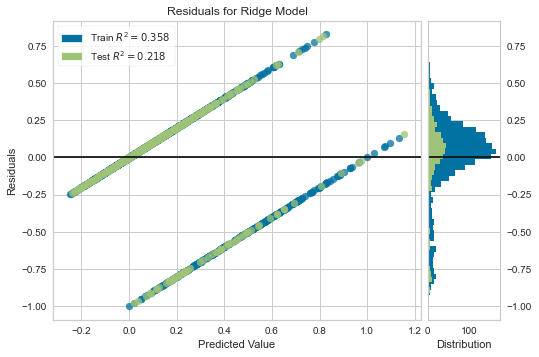

<AxesSubplot:title={'center':'Residuals for Ridge Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [115]:
visualizer = ResidualsPlot(model)
visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test)  # Evaluate the model on the test data
visualizer.show()  

In [ ]:
visualizer.show() 